In [289]:
import numpy as np 
from scipy.optimize import minimize
import matplotlib.pyplot as plt
from matplotlib import rcParams 
import matplotlib.lines as mlines
from matplotlib.ticker import FuncFormatter
from matplotlib.ticker import LinearLocator
import celerite
import emcee
from celerite import terms
from astropy.table import Table
from astropy.table import vstack
from astropy.table import Column
import modules as mod
rcParams['ytick.labelsize'] = 15
rcParams['xtick.labelsize'] = 15
rcParams['axes.labelsize'] = 20
rcParams['axes.linewidth'] = 2
rcParams['font.size'] = 15
rcParams['axes.titlesize'] = 18

### Table of Contents:  <a id='toc'></a>
    
   * [The components  - building blocks](#buildingBlocks)
       * [the model: plain DRW](#model)
       * [the log posterior](#logP)
       * [the MAP-estimate of parameters with Celerite](#calcMAP)
       * [calculate logP on a grid](#logPgrid)
       * [given logP, find the denser grid](#increaseGrid)
       * [code to plot the logP](#plotPosterior)
   * [Simulations](#simulations)
       * [1: use Celerite to find MAP for N light curves](#sim1)
       * [2: illustrate the adaptative grid](#sim2)
          * [2a: learn how to plot from AstroML](#astroMLfigures)
          * [2D function   $f(x,y) = \sin{(y^{2})}$](#2dFunc)
          * [Fig 5.12 LogL Uniform Dist](#fig5.12)
          * [Fig 5.22 MCMC for Cauchy](#fig5.22)
          * [Try out using MCMC with Celerite](#tryMCMC)
       * [3: Dependence of logL on N](#sim3)
       * [4: Using old DRW to confirm we get the same result](#sim4)
       * [5: Fit a 'perfect' DRW of Kozlowski to show we recover $\tau$ ](#sim5)
    

### Building blocks of adaptative grid approach <a id='buildingBlocks'></a>

The idea is to simulate DRW light curve, find the MAP solution with Celerite, which probes logPosterior to find the maximum. Then we evaluate logPosterior with Celerite on a coarse grid of $(\tau,\sigma)$ parameters,  given the marginalized shape of $P(\sigma)$, $P(\tau)$, we find the region where the majority of logP information is contained, and re-calculate logP on  a denser grid, with narrower bounds. We use the new grid to find the new estimate on maximum location of 2D logP, as well as the expectation values of hyperparameters given the marginalized pdfs. 

In [286]:
import modules as mod
import imp
imp.reload(mod)

<module 'modules' from '/Users/chris/GradResearch/Paper2_SDSS_PTF_PS1/code/modules.py'>

#### The model: from modules.py <a id='model'></a>
[toc](#toc)

<Container object of 3 artists>

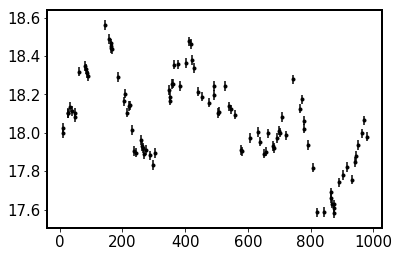

In [14]:
%matplotlib inline 

# EXAMPLE light curve 
# set the input parameters 
sigma_in = 0.2
tau_in = 100
#print('tau_in: ', tau_in, 'sigma_in: ', sigma_in)

SF_inf =  sigma_in * np.sqrt(2)

# random draw from a uniform distribution between 0 and ten times the 
# input timescale 
t = np.sort(np.random.uniform(0,10*tau_in, 100)) 
y = mod.sim_DRW_lightcurve(t, SF_inf, tau_in , 18)
yerr = 0.0248 
plt.errorbar(t,y,yerr,fmt=".k")

#### The log Posterior : <a id='logP'></a>
[toc](#toc)

In [351]:
(6500 / 50)

130.0

In [12]:
# --> moved to   modules.py 

# define the negative log likelihood
def neg_log_posterior(params,y,gp,prior):
    if prior is 'None' : 
        gp.set_parameter_vector(params)
        return -gp.log_likelihood(y, quiet=True)

    if prior is 'Jeff1' : # (1/sigma) * (1/tau) 
        gp.set_parameter_vector(params)
        log_a  , log_c =  params
        log_prior = - (log_a / 2.0) + log_c
        return -gp.log_likelihood(y, quiet=True) - log_prior

    if prior is 'Jeff2' : # (1/sigma_hat) * (1/tau) - the one used by Kozlowski , 
        # as well as Chelsea... 
        gp.set_parameter_vector(params)
        log_a  , log_c =  params
        log_prior  = 0.5* (-np.log(2.0) - log_a + log_c  )
        return -gp.log_likelihood(y, quiet=True)  - log_prior



#### Find the MAP wth Celerite <a id='calcMAP'></a>
[toc](#toc)

In [16]:
# --> moved to   modules.py 

# define the function for fitting a light curve 
# with Celerite,  and finding the MAP 
# estimate for DRW parameters 
            
def find_celerite_MAP(t,y,yerr, sigma_in, tau_in,prior='None',
                      set_bounds = True , sig_lims = [0.02, 0.7]  , 
                      tau_lims = [1,550],
                      verbose=True):
    kernel = terms.RealTerm(log_a = 2 * np.log(sigma_in) , 
                            log_c = np.log(1.0/tau_in))
    gp = celerite.GP(kernel, mean=np.mean(y))
    gp.compute(t, yerr)

    # set initial params 
    initial_params = gp.get_parameter_vector()
    if verbose:
        print(initial_params)
    
    # set boundaries 
    if set_bounds:
        if verbose : 
            print('sig_lims:', sig_lims, 'tau_lims:', tau_lims)
        tau_bounds, sigma_bounds = tau_lims, sig_lims
        loga_bounds = (2*np.log(min(sigma_bounds)), 
                       2*np.log(max(sigma_bounds))
                      )
        logc_bounds= (np.log(1/max(tau_bounds)), 
                      np.log(1/ min(tau_bounds))
                     )
        bounds = [loga_bounds, logc_bounds]

    else : # - inf to + inf 
        bounds = gp.get_parameter_bounds()
    if verbose :
        print(bounds)

    # wrap the neg_log_posterior for a chosen prior 
    def neg_log_like(params,y,gp):
        return neg_log_posterior(params,y,gp,prior)
    
    # find MAP solution 
    r = minimize(neg_log_like, initial_params, 
             method="L-BFGS-B", bounds=bounds, args=(y, gp))
    gp.set_parameter_vector(r.x)
    res = gp.get_parameter_dict()

    tau_fit = np.exp(-res['kernel:log_c'])
    sigma_fit = np.exp(res['kernel:log_a']/2)
    if verbose : 
        print('sigma_fit', sigma_fit,'tau_fit', tau_fit)
    return sigma_fit, tau_fit , gp

# --> moved to   modules.py 
# plotting the gp prediction 
def plot_gp_prediction(t,y,yerr,gp,sigma_fit, tau_fit,
                      savefig=False, figname=''):
    # plot the prediction conditioned on the observed data 
    x = np.linspace(min(t), max(t), 5000)
    pred_mean, pred_var = gp.predict(y, x, return_var=True)
    pred_std = np.sqrt(pred_var)

    color = "#ff7f0e"
    fig,ax = plt.subplots(1,1,figsize=(8,6))
    ax.errorbar(t, y, yerr=yerr, fmt=".k", capsize=0)
    ax.plot(x, pred_mean, color=color)
    ax.fill_between(x, pred_mean+pred_std, pred_mean-pred_std, 
                     color=color, alpha=0.3,
                     )
    ax.set_xlabel('days')
    ax.set_ylabel('mag')
    x0,x1 = ax.get_xbound()
    y0,y1 = ax.get_ybound()
    xbase = x1-x0
    ybase = y1-y0
    ax.text(x0+0.3*xbase,  y0+0.8*ybase, r'$\sigma_{MAP}=$ '+str(sigma_fit)[:5]+'\n  '+\
           r'$\tau_{MAP}=$ '+str(tau_fit)[:6], fontsize=20)
    if savefig : 
        plt.savefig(figname, bbox_inches='tight')




[-3.21887582 -4.60517019]
sig_lims: [0.02, 0.7] tau_lims: [1, 1000]
[(-7.8240460108562919, -0.71334988787746489), (-6.9077552789821368, 0.0)]
sigma_fit 0.145867155978 tau_fit 64.6817182703


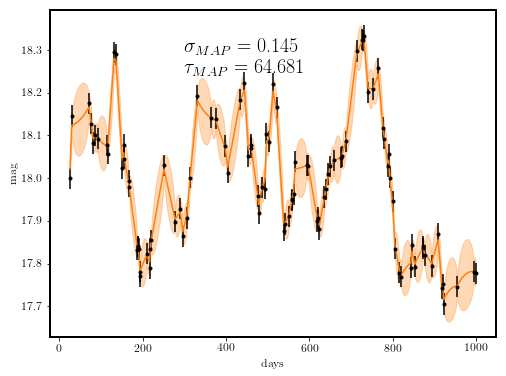

In [287]:
#
# TESTING CELL for the code above  : find_celerite_MAP()
#
# set the input parameters  for simulated light curve 
sigma_in = 0.2 ; tau_in = 100
SF_inf =  sigma_in * np.sqrt(2)
Npoints  = 100
t = np.sort(np.random.uniform(0,10*tau_in, Npoints)) 
y = mod.sim_DRW_lightcurve(t, SF_inf, tau_in , 18)
yerr = 0.0248 

# find the MAP solution
sig_lims , tau_lims = [0.02,0.7], [1,1000]
sigma_fit, tau_fit,gp = mod.find_celerite_MAP(t,y,yerr, sigma_in, tau_in,prior='Jeff1',
                      set_bounds = True , sig_lims = sig_lims  , 
                      tau_lims =tau_lims, 
                                          verbose = True )

plot_gp_prediction(t,y,yerr,gp,sigma_fit, tau_fit,
                      savefig=False, figname='')

#### Evaluate logP on a grid <a id='logPgrid'></a>
[toc](#toc)

In [288]:
# --> moved to   modules.py 
    
# a function to evaluate the log Posterior 
# on a given grid of sigma ,tau  
# given the data 
def evaluate_logP(sigma_grid, tau_grid, y,gp, prior='None'):
    
    log_a_grid = 2 * np.log(sigma_grid)
    log_c_grid = np.log(1/tau_grid)

    # loop over the likelihood space .... 
    logPosterior = np.zeros([len(sigma_grid),len(tau_grid)], 
                            dtype=float)
    for k in range(len(log_a_grid)):
        for l in range(len(log_c_grid)):
            params = [log_a_grid[k],log_c_grid[l]]    
            logPosterior[k,l] = -neg_log_posterior(params,y,gp, prior)
    return logPosterior

        
        

#### Given logP, calculate the denser grid <a id='increaseGrid'></a>
[toc](#toc)

In [23]:
def increase_grid_density(logP, grid, param= 'sigma', threshold=0.1, by_hand=True, 
                          density=2,
                         verbose=True):
    dx = grid[1] - grid[0]
    if param is 'tau':
        p_x = np.exp(logP).sum(0)
    if param is 'sigma':
        p_x = np.exp(logP).sum(1)
    p_x /= p_x.sum() * (dx)  # this ensures probability adds up to 1 
    p_x /= max(p_x)  # this ensures that maximum prob is 1 
    if verbose:
        print('p(x)>', threshold, ' for the following grid indices ' )
        print(np.where(p_x > threshold)[0])

    if np.sum(p_x > threshold) > 1 : 
        # this assumes that there is at least one point that is above the thresho
        min_idx = np.where(p_x > threshold)[0][0]  
        max_idx = np.where(p_x > threshold)[0][-1]

        # increase the grid density, from min_idx to max_idx 
        x0 = grid[min_idx:max_idx]
        if by_hand : 
            x1 = x0 + dx/2
            x2 = np.sort(np.append(x0,x1[:-1]))
            new_grid = x2

        if not by_hand : # make it D times more dense than the original density
            x2 = np.linspace(min(x0), max(x0), density*len(x0))
            new_grid = x2

        if verbose : 
            print('Old grid:', x0)
            print('New grid:', x2)
        return new_grid
    else:
        print('ERROR : no point in marginalized likelihood is \
              above the set threshold of ', threshold)
        return

# Illustrate the gridding ...
for l in x0 : 
    plt.axvline(l, c='b')
for l in x1 : 
    plt.axvline(l, c='red')
plt.xlim(x0[0], x0[-1])

#### Plot log Posterior  <a id='plotPosterior'></a>
[toc](#toc)

In [323]:
# --> moved to   modules.py 

def make_grid(scale, sig_lims, tau_lims,Ngrid):
    
    if scale is 'linear':
        print(scale)
        sigma_grid = np.linspace(sig_lims[0], sig_lims[1],Ngrid )
        tau_grid  = np.linspace(tau_lims[0], tau_lims[1], Ngrid)
    if scale is 'log':
        print(scale)
        sigma_grid = np.logspace(np.log10(sig_lims[0]), np.log10(sig_lims[1]),Ngrid )
        tau_grid  = np.logspace(np.log10(tau_lims[0]), np.log10(tau_lims[1]), Ngrid)
    return sigma_grid, tau_grid

# --> moved to   modules.py 
def find_expectation_value(logPosterior, sigma_grid, tau_grid, sigmaMAP, tauMAP, 
               sigma_true,tau_true, scale='linear', verbose=False,
                          setMinimum = True):
    # the code here follows plot_logP,  
    # it's the same , minus the plotting part to 
    # declutter...
    
    logP = logPosterior
    logP -= logP.max()
    
    tau = tau_grid
    sigma = sigma_grid
    if setMinimum : 
        logP[logP < -10] = -10  # set the minimum for plotting 
    #
    # sigma 
    #
    p_sigma = np.exp(logP).sum(1) 
    # we subtract the smallest value to ensure that 
    # the probability goes down to zero, otherwise p_sigma is 
    # nonzero where it should be ... 
    # this is the outcome of the logP[logP < -10] = -10 line !~!!!! 
    if setMinimum : 
        p_sigma -= min(p_sigma) 
    # this simply ensures that it goes down to zero
     
    # normalization factor: integral (p_sigma  dsigma ) , 
    # dx is inferred from the provided x-samples 
    # we normalize so that  the integral over p_sigma  == 1 : 
    # np.trapz(p_sigma, sigma) == 1 
    p_sigma_norm  = np.trapz(y=p_sigma, x=sigma) 
    p_sigma /= p_sigma_norm
    sigma_exp = np.trapz(y=sigma*p_sigma, x=sigma)
    if verbose: 
        print('sigma_exp=', sigma_exp)
    #
    # tau 
    # 
    p_tau = np.exp(logP).sum(0)
    if setMinimum: 
        p_tau -= min(p_tau)
    p_tau_norm = np.trapz(y=p_tau, x=tau) # doesn't matter whether linear samples  
    p_tau /= p_tau_norm
    tau_exp =  np.trapz(y=tau*p_tau,x=tau)  #find_expectation_value(tau, p_tau )
    if verbose: 
        print('tau_exp=', tau_exp)

    return sigma_exp, tau_exp

# --> moved to   modules.py 
def plot_logP(logPosterior, sigma_grid, tau_grid, sigmaMAP, tauMAP, 
               sigma_true,tau_true, scale='linear', verbose=False,
              savefig=False, figname=None):
    logP = logPosterior
    logP -= logP.max() # subtact the maximum to avoid overflow 
    idx = np.where(logP == np.max(logP)) # for 2D maximum

    tau = tau_grid
    sigma = sigma_grid

    # first axis: likelihood contours
    fig = plt.figure(figsize=(10, 10))
    ax1 = fig.add_axes((0.4, 0.4, 0.55, 0.55))
    ax1.xaxis.set_major_formatter(plt.NullFormatter())
    ax1.yaxis.set_major_formatter(plt.NullFormatter())

    logP[logP < -10] = -10  # set the minimum for plotting 
    image = ax1.imshow(-logP, extent=(tau[0], tau[-1], 
                              sigma[0], sigma[-1]),
                  cmap=plt.cm.get_cmap('RdYlBu'),
                  aspect='auto', origin='lower')
    ax1.set_ylabel(r'$\sigma$')
    ax1.set_xlabel(r'$\tau$')

    # second axis: marginalized over sigma
    ax2 = fig.add_axes((0.1, 0.4, 0.29, 0.55))
    ax2.xaxis.set_major_formatter(plt.NullFormatter())
    p_sigma = np.exp(logP).sum(1) 
    p_sigma -= min(p_sigma) # this simply ensures that it goes down to zero
    # we subtract the smallest value -  otherwise p_sigma is 
    # nonzero where it should be ... 
    # this is the outcome of the logP[logP < -10] = -10 line !~!!!! 
    
    # normalization factor: integral (p_sigma  dsigma ) , 
    # dx is inferred from the provided x-samples 
    # we normalize so that 
    # the integral over p_sigma  == 1 : 
    # np.trapz(p_sigma, sigma) == 1 
    p_sigma_norm  = np.trapz(y=p_sigma, x=sigma) 
    p_sigma /= p_sigma_norm
    sigma_exp = np.trapz(y=sigma*p_sigma, x=sigma)
    print('sigma_exp=', sigma_exp)

    def log_10_product(x, pos):
        """The two args are the value and tick position.
        Label ticks with the product of the exponentiation"""
        return '%.1f' % (x)

    if scale is 'log':
        formatter = FuncFormatter(log_10_product)

    sigma_max = sigma[idx[0]][0]
    ax2.plot(p_sigma, sigma,'-o')
    ax2.set_xlim(ax2.get_xlim()[::-1])  # reverse x axis
    ax2.set_ylim(sigma[0], sigma[-1])
    ax2.set_ylabel(r'$\sigma$')
    
    # Axis scale must be set prior to declaring the Formatter
    # If it is not the Formatter will use the default log labels for ticks.
    ax2.set_yscale(scale)
    if scale is 'log':  # makes the sigma values look better for logspace 
        ax2.yaxis.set_major_locator(LinearLocator(5))
        ax2.yaxis.set_major_formatter(formatter)


    # third axis: marginalized over tau
    ax3 = fig.add_axes((0.4, 0.1, 0.55, 0.29))
    p_tau = np.exp(logP).sum(0)
    p_tau -= min(p_tau)
    p_tau_norm = np.trapz(y=p_tau, x=tau) # doesn't matter whether linear samples  
    p_tau /= p_tau_norm
    tau_exp =  np.trapz(y=tau*p_tau,x=tau)  #find_expectation_value(tau, p_tau )
    print('tau_exp=', tau_exp)

    tau_max = tau[idx[1]][0]
    ax3.yaxis.set_major_formatter(plt.NullFormatter())
    ax3.plot(tau, p_tau,'-o')
    #ax3.scatter(tau, p_tau)
    ax3.set_xlim(tau[0], tau[-1])
    ax3.set_ylim(0.8*min(p_tau), 1.1*max(p_tau))
    ax3.set_xlabel(r'$\tau$')
    ax3.set_xscale(scale)
    #print('2D max values  are sigma_max', sigma_max)
    #print('and tau_max', tau_max)

    # make legend : dictionary with color, linestyle, label 
    # also, add each line to the plot 
    legend = True 
    if legend : 
        method_dic = {'expectation':['green','-.', 'expectation', sigma_exp, tau_exp],
                      'MAP':['purple','--', 'scipy MAP', sigmaMAP, tauMAP],
                      #'max':['red','-.','2D grid max', sigma_max, tau_max],
                      'input':['orange', '-', 'true', sigma_true, tau_true]
                     }
        ax_legend_handles = []

        for method in method_dic.keys():
            plot = method_dic[method]
            ax2.axhline(plot[3], color = plot[0], ls = plot[1])#, label  = plot[2])
            ax3.axvline(plot[4], color = plot[0], ls = plot[1])#, label  = plot[2])
            line = mlines.Line2D([], [], color=plot[0],  ls=plot[1],
                                 label=plot[2])
            ax_legend_handles.append(line)
            
        # add legend... 
        legend_ax = fig.add_axes([0.1, 0.1, 0.29, 0.29])     #  (x0 ,y0  , dx,  dy )  
        legend_ax.legend(loc='upper left', handles = ax_legend_handles, frameon=False,
                         fontsize=15, bbox_to_anchor=(0
                                                      , 0.9))
        legend_ax.axis('off')
    if savefig : 
        if figname is None:
            print('Need to provide figname! ')
        else:
            plt.savefig(figname, bbox_inches='tight')
        
    return logP, sigma_exp, tau_exp



In [290]:
# Try out various elements of the grid ... 

rho_min, rho_max,  n_rho = 0.001, 15, 100
rho_grid = np.logspace(np.log10(rho_min), np.log10(rho_max), n_rho)
t_exp = 8 * 365.0 # in days 


In [325]:
import modules as mod
imp.reload(mod)

<module 'modules' from '/Users/chris/GradResearch/Paper2_SDSS_PTF_PS1/code/modules.py'>

In [365]:
# Try it out  on SDSS-like  or OGLE-like  LCs....
simulation = 'OGLE'#'SDSS' # or 'OGLE'

i = 40
if simulation is 'SDSS': 
    N = 60 # points per light curve 
    r = 17 # mag 
    variance = 0.013**2.0 + np.exp(2 * (r-23.36))
    t = np.loadtxt('t_SDSS.txt')
    
if simulation is 'OGLE':
    N = 445 
    I = 18 # mag 
    variance = 0.004**2.0 + np.exp(1.63 * (I - 22.55))    
    t =  np.loadtxt('t_OGLE.txt')
    
# set the input parameters  for simulated light curve 
sigma_in = 0.2 ; tau_in = rho_grid[i] * t_exp
print('tau in = ', tau_in)
print('np.log10(rho in) = ', np.log10(rho_grid[i]))
SF_inf =  sigma_in * np.sqrt(2)

# simulate the ideal light curve 
y = mod.sim_DRW_lightcurve(t, SF_inf, tau_in , 18)

# add Gaussian noise 
noise = np.random.normal(loc=0,scale=np.sqrt(variance),size=len(t))
y += noise +10 # eq.2 Kozlowski+2017
yerr = np.ones_like(t)* np.sqrt(variance)

lc = Table(data=[t,y,yerr], names=['t','y','yerr'])
lc.write('OGLE_LC_i-40.txt', format='ascii', overwrite=True)

tau in =  142.132191075
np.log10(rho in) =  -1.31269040038


[-3.21887582 -4.95675755]
sig_lims: [0.02, 0.7] tau_lims: [1, 45000]
[(-7.8240460108562919, -0.71334988787746489), (-10.714417768752456, 0.0)]
sigma_fit 0.148390719196 tau_fit 87.5710706355
np.log10(rho out MAP) =  -1.52302219207
sigma_exp= 0.158786461402
tau_exp= 109.467709304
np.log10(rho out EXP) =  -1.42609682121


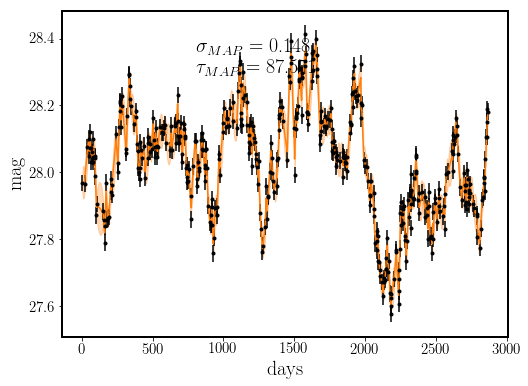

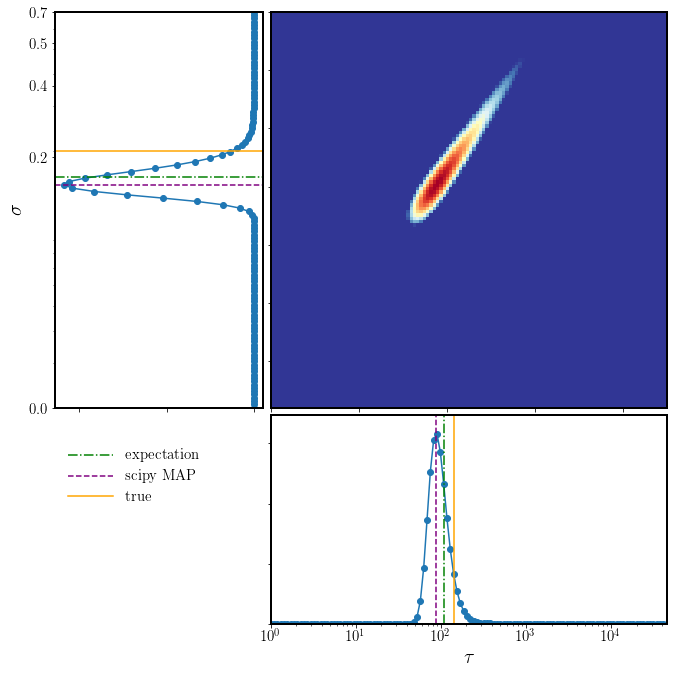

In [366]:
# find the MAP solution
sig_lims , tau_lims = [0.02,0.7], [1,45000]
sigma_fit, tau_fit,gp = mod.find_celerite_MAP(t,y,yerr, sigma_in, 
                                              tau_in,prior='Jeff1', set_bounds = True , 
                                              sig_lims = sig_lims  , 
                      tau_lims =tau_lims, verbose = True )
print('np.log10(rho out MAP) = ', np.log10(tau_fit / t_exp))
# plot the prediction
mod.plot_gp_prediction(t,y,yerr,gp,sigma_fit, tau_fit,
                     savefig=False, figname='')

# evaluate logP on a  grid 
Ngrid = 120 
# choose scale : linear or log ?  --> I think logarithmic is way more useful  :) 
scale = 'log'
sigma_grid, tau_grid = mod.make_grid(scale,sig_lims, tau_lims, Ngrid )
logP = mod.evaluate_logP(sigma_grid, tau_grid,y,gp, prior='Jeff1')

# plot the logP
logP, sigma_exp, tau_exp  = mod.plot_logP(logP, sigma_grid, tau_grid, sigma_fit, tau_fit,  
                     sigma_in, tau_in, scale,verbose=True,
                                         savefig=True, 
                                figname='OGLE_LC_i-40_logP.png')
# evaluate 
print('np.log10(rho out EXP) = ', np.log10(tau_exp / t_exp))


In [362]:
mod.plot_logP?

[Go to using this function](#testPlotting)

### Simulations  : using the building blocks <a id='simulations'></a>

#### Simulation 1 : many DRW iterations: find MAP <a id='sim1'></a>
[toc](#toc)

Setup to simulate 1000 DRW with fixed params, etc., and test how well the MAP approximates input parameters

This setup can be used to easily test how well Celerite fits the DRW model for a range of input parameters...

In [273]:
# set the input parameters 
sigma_in = 0.2 ; tau_in = 100
SF_inf =  sigma_in * np.sqrt(2)

# random draw from a uniform distribution 
# between 0 and ten times the input timescale 
sigmaFit = []
tauFit = []
for i in range(1000):
    t = np.sort(np.random.uniform(0,10*tau_in, 200)) 
    y = mod.sim_DRW_lightcurve(t, SF_inf, tau_in , 18)
    yerr = 0.0248 

    # find the MAP solution
    sigma_fit, tau_fit , _ = find_celerite_MAP(t,y,yerr, sigma_in, tau_in,set_bounds = True ,
                         sig_lims = [0.02, 0.7]  , tau_lims = [1,550],
                        plot_prediction=False, verbose = False )
    sigmaFit.append(sigma_fit)
    tauFit.append(tau_fit)

[-3.21887582 -4.60517019]
sig_lims: [0.02, 0.7] tau_lims: [1, 550]
[(-7.8240460108562919, -0.71334988787746489), (-6.3099182782265162, 0.0)]
sigma_fit 0.183233601804 tau_fit 150.809493681
[-3.21887582 -4.60517019]
sig_lims: [0.02, 0.7] tau_lims: [1, 550]
[(-7.8240460108562919, -0.71334988787746489), (-6.3099182782265162, 0.0)]
sigma_fit 0.141868820417 tau_fit 69.2711652894
[-3.21887582 -4.60517019]
sig_lims: [0.02, 0.7] tau_lims: [1, 550]
[(-7.8240460108562919, -0.71334988787746489), (-6.3099182782265162, 0.0)]
sigma_fit 0.175228517253 tau_fit 94.7735710931
[-3.21887582 -4.60517019]
sig_lims: [0.02, 0.7] tau_lims: [1, 550]
[(-7.8240460108562919, -0.71334988787746489), (-6.3099182782265162, 0.0)]
sigma_fit 0.122873020375 tau_fit 50.3944084818
[-3.21887582 -4.60517019]
sig_lims: [0.02, 0.7] tau_lims: [1, 550]
[(-7.8240460108562919, -0.71334988787746489), (-6.3099182782265162, 0.0)]
sigma_fit 0.203421595852 tau_fit 166.613929136
[-3.21887582 -4.60517019]
sig_lims: [0.02, 0.7] tau_lims: [1

sigma_fit 0.153257418489 tau_fit 78.011684414
[-3.21887582 -4.60517019]
sig_lims: [0.02, 0.7] tau_lims: [1, 550]
[(-7.8240460108562919, -0.71334988787746489), (-6.3099182782265162, 0.0)]
sigma_fit 0.186726085909 tau_fit 139.637205697
[-3.21887582 -4.60517019]
sig_lims: [0.02, 0.7] tau_lims: [1, 550]
[(-7.8240460108562919, -0.71334988787746489), (-6.3099182782265162, 0.0)]
sigma_fit 0.146147048123 tau_fit 86.5022100001
[-3.21887582 -4.60517019]
sig_lims: [0.02, 0.7] tau_lims: [1, 550]
[(-7.8240460108562919, -0.71334988787746489), (-6.3099182782265162, 0.0)]
sigma_fit 0.153354423605 tau_fit 64.9881907403
[-3.21887582 -4.60517019]
sig_lims: [0.02, 0.7] tau_lims: [1, 550]
[(-7.8240460108562919, -0.71334988787746489), (-6.3099182782265162, 0.0)]
sigma_fit 0.208565729726 tau_fit 142.326450429
[-3.21887582 -4.60517019]
sig_lims: [0.02, 0.7] tau_lims: [1, 550]
[(-7.8240460108562919, -0.71334988787746489), (-6.3099182782265162, 0.0)]
sigma_fit 0.191129266657 tau_fit 93.1736548807
[-3.21887582 -

sigma_fit 0.187153677911 tau_fit 142.1418026
[-3.21887582 -4.60517019]
sig_lims: [0.02, 0.7] tau_lims: [1, 550]
[(-7.8240460108562919, -0.71334988787746489), (-6.3099182782265162, 0.0)]
sigma_fit 0.130399321888 tau_fit 56.6937010256
[-3.21887582 -4.60517019]
sig_lims: [0.02, 0.7] tau_lims: [1, 550]
[(-7.8240460108562919, -0.71334988787746489), (-6.3099182782265162, 0.0)]
sigma_fit 0.134386651029 tau_fit 62.0171990162
[-3.21887582 -4.60517019]
sig_lims: [0.02, 0.7] tau_lims: [1, 550]
[(-7.8240460108562919, -0.71334988787746489), (-6.3099182782265162, 0.0)]
sigma_fit 0.163497822911 tau_fit 112.597650871
[-3.21887582 -4.60517019]
sig_lims: [0.02, 0.7] tau_lims: [1, 550]
[(-7.8240460108562919, -0.71334988787746489), (-6.3099182782265162, 0.0)]
sigma_fit 0.126055442751 tau_fit 44.3697653999
[-3.21887582 -4.60517019]
sig_lims: [0.02, 0.7] tau_lims: [1, 550]
[(-7.8240460108562919, -0.71334988787746489), (-6.3099182782265162, 0.0)]
sigma_fit 0.197191163008 tau_fit 116.052001572
[-3.21887582 -4

sigma_fit 0.198803845534 tau_fit 113.59798985
[-3.21887582 -4.60517019]
sig_lims: [0.02, 0.7] tau_lims: [1, 550]
[(-7.8240460108562919, -0.71334988787746489), (-6.3099182782265162, 0.0)]
sigma_fit 0.160609207908 tau_fit 72.2002482211
[-3.21887582 -4.60517019]
sig_lims: [0.02, 0.7] tau_lims: [1, 550]
[(-7.8240460108562919, -0.71334988787746489), (-6.3099182782265162, 0.0)]
sigma_fit 0.139191620763 tau_fit 83.661380415
[-3.21887582 -4.60517019]
sig_lims: [0.02, 0.7] tau_lims: [1, 550]
[(-7.8240460108562919, -0.71334988787746489), (-6.3099182782265162, 0.0)]
sigma_fit 0.128251079986 tau_fit 50.817015777
[-3.21887582 -4.60517019]
sig_lims: [0.02, 0.7] tau_lims: [1, 550]
[(-7.8240460108562919, -0.71334988787746489), (-6.3099182782265162, 0.0)]
sigma_fit 0.153813010087 tau_fit 94.462362214
[-3.21887582 -4.60517019]
sig_lims: [0.02, 0.7] tau_lims: [1, 550]
[(-7.8240460108562919, -0.71334988787746489), (-6.3099182782265162, 0.0)]
sigma_fit 0.149911042973 tau_fit 68.4139490889
[-3.21887582 -4.6

sig_lims: [0.02, 0.7] tau_lims: [1, 550]
[(-7.8240460108562919, -0.71334988787746489), (-6.3099182782265162, 0.0)]
sigma_fit 0.158308865523 tau_fit 123.126707819
[-3.21887582 -4.60517019]
sig_lims: [0.02, 0.7] tau_lims: [1, 550]
[(-7.8240460108562919, -0.71334988787746489), (-6.3099182782265162, 0.0)]
sigma_fit 0.1482415929 tau_fit 82.1565064899
[-3.21887582 -4.60517019]
sig_lims: [0.02, 0.7] tau_lims: [1, 550]
[(-7.8240460108562919, -0.71334988787746489), (-6.3099182782265162, 0.0)]
sigma_fit 0.15024111585 tau_fit 67.2339505358
[-3.21887582 -4.60517019]
sig_lims: [0.02, 0.7] tau_lims: [1, 550]
[(-7.8240460108562919, -0.71334988787746489), (-6.3099182782265162, 0.0)]
sigma_fit 0.131029742712 tau_fit 72.3656336708
[-3.21887582 -4.60517019]
sig_lims: [0.02, 0.7] tau_lims: [1, 550]
[(-7.8240460108562919, -0.71334988787746489), (-6.3099182782265162, 0.0)]
sigma_fit 0.15102684997 tau_fit 83.5889240231
[-3.21887582 -4.60517019]
sig_lims: [0.02, 0.7] tau_lims: [1, 550]
[(-7.8240460108562919, 

sigma_fit 0.163054820197 tau_fit 119.89614032
[-3.21887582 -4.60517019]
sig_lims: [0.02, 0.7] tau_lims: [1, 550]
[(-7.8240460108562919, -0.71334988787746489), (-6.3099182782265162, 0.0)]
sigma_fit 0.142782490663 tau_fit 65.1584484437
[-3.21887582 -4.60517019]
sig_lims: [0.02, 0.7] tau_lims: [1, 550]
[(-7.8240460108562919, -0.71334988787746489), (-6.3099182782265162, 0.0)]
sigma_fit 0.207778718104 tau_fit 147.468215739
[-3.21887582 -4.60517019]
sig_lims: [0.02, 0.7] tau_lims: [1, 550]
[(-7.8240460108562919, -0.71334988787746489), (-6.3099182782265162, 0.0)]
sigma_fit 0.155555103521 tau_fit 72.5656988725
[-3.21887582 -4.60517019]
sig_lims: [0.02, 0.7] tau_lims: [1, 550]
[(-7.8240460108562919, -0.71334988787746489), (-6.3099182782265162, 0.0)]
sigma_fit 0.137904289408 tau_fit 72.4658927177
[-3.21887582 -4.60517019]
sig_lims: [0.02, 0.7] tau_lims: [1, 550]
[(-7.8240460108562919, -0.71334988787746489), (-6.3099182782265162, 0.0)]
sigma_fit 0.20990355823 tau_fit 112.946352369
[-3.21887582 -4

sigma_fit 0.154345244268 tau_fit 99.7959437926
[-3.21887582 -4.60517019]
sig_lims: [0.02, 0.7] tau_lims: [1, 550]
[(-7.8240460108562919, -0.71334988787746489), (-6.3099182782265162, 0.0)]
sigma_fit 0.149606403502 tau_fit 88.3857716938
[-3.21887582 -4.60517019]
sig_lims: [0.02, 0.7] tau_lims: [1, 550]
[(-7.8240460108562919, -0.71334988787746489), (-6.3099182782265162, 0.0)]
sigma_fit 0.229796768478 tau_fit 185.606923448
[-3.21887582 -4.60517019]
sig_lims: [0.02, 0.7] tau_lims: [1, 550]
[(-7.8240460108562919, -0.71334988787746489), (-6.3099182782265162, 0.0)]
sigma_fit 0.233302940081 tau_fit 139.847570678
[-3.21887582 -4.60517019]
sig_lims: [0.02, 0.7] tau_lims: [1, 550]
[(-7.8240460108562919, -0.71334988787746489), (-6.3099182782265162, 0.0)]
sigma_fit 0.240073603003 tau_fit 216.201366836
[-3.21887582 -4.60517019]
sig_lims: [0.02, 0.7] tau_lims: [1, 550]
[(-7.8240460108562919, -0.71334988787746489), (-6.3099182782265162, 0.0)]
sigma_fit 0.191002841702 tau_fit 101.35416048
[-3.21887582 -

sig_lims: [0.02, 0.7] tau_lims: [1, 550]
[(-7.8240460108562919, -0.71334988787746489), (-6.3099182782265162, 0.0)]
sigma_fit 0.204913773585 tau_fit 118.691221675
[-3.21887582 -4.60517019]
sig_lims: [0.02, 0.7] tau_lims: [1, 550]
[(-7.8240460108562919, -0.71334988787746489), (-6.3099182782265162, 0.0)]
sigma_fit 0.166950933495 tau_fit 103.747150921
[-3.21887582 -4.60517019]
sig_lims: [0.02, 0.7] tau_lims: [1, 550]
[(-7.8240460108562919, -0.71334988787746489), (-6.3099182782265162, 0.0)]
sigma_fit 0.146819879624 tau_fit 73.4383405155
[-3.21887582 -4.60517019]
sig_lims: [0.02, 0.7] tau_lims: [1, 550]
[(-7.8240460108562919, -0.71334988787746489), (-6.3099182782265162, 0.0)]
sigma_fit 0.195135152074 tau_fit 134.529748023
[-3.21887582 -4.60517019]
sig_lims: [0.02, 0.7] tau_lims: [1, 550]
[(-7.8240460108562919, -0.71334988787746489), (-6.3099182782265162, 0.0)]
sigma_fit 0.155146454069 tau_fit 71.5170934059
[-3.21887582 -4.60517019]
sig_lims: [0.02, 0.7] tau_lims: [1, 550]
[(-7.82404601085629

[(-7.8240460108562919, -0.71334988787746489), (-6.3099182782265162, 0.0)]
sigma_fit 0.149737157536 tau_fit 83.7267656884
[-3.21887582 -4.60517019]
sig_lims: [0.02, 0.7] tau_lims: [1, 550]
[(-7.8240460108562919, -0.71334988787746489), (-6.3099182782265162, 0.0)]
sigma_fit 0.163364002974 tau_fit 75.4383415722
[-3.21887582 -4.60517019]
sig_lims: [0.02, 0.7] tau_lims: [1, 550]
[(-7.8240460108562919, -0.71334988787746489), (-6.3099182782265162, 0.0)]
sigma_fit 0.176810089426 tau_fit 78.0938744005
[-3.21887582 -4.60517019]
sig_lims: [0.02, 0.7] tau_lims: [1, 550]
[(-7.8240460108562919, -0.71334988787746489), (-6.3099182782265162, 0.0)]
sigma_fit 0.264678912426 tau_fit 235.192281403
[-3.21887582 -4.60517019]
sig_lims: [0.02, 0.7] tau_lims: [1, 550]
[(-7.8240460108562919, -0.71334988787746489), (-6.3099182782265162, 0.0)]
sigma_fit 0.231250689491 tau_fit 163.986148068
[-3.21887582 -4.60517019]
sig_lims: [0.02, 0.7] tau_lims: [1, 550]
[(-7.8240460108562919, -0.71334988787746489), (-6.3099182782

sig_lims: [0.02, 0.7] tau_lims: [1, 550]
[(-7.8240460108562919, -0.71334988787746489), (-6.3099182782265162, 0.0)]
sigma_fit 0.15279104934 tau_fit 68.3897641845
[-3.21887582 -4.60517019]
sig_lims: [0.02, 0.7] tau_lims: [1, 550]
[(-7.8240460108562919, -0.71334988787746489), (-6.3099182782265162, 0.0)]
sigma_fit 0.106278428821 tau_fit 43.8371579498
[-3.21887582 -4.60517019]
sig_lims: [0.02, 0.7] tau_lims: [1, 550]
[(-7.8240460108562919, -0.71334988787746489), (-6.3099182782265162, 0.0)]
sigma_fit 0.168143343784 tau_fit 100.997414538
[-3.21887582 -4.60517019]
sig_lims: [0.02, 0.7] tau_lims: [1, 550]
[(-7.8240460108562919, -0.71334988787746489), (-6.3099182782265162, 0.0)]
sigma_fit 0.179190799707 tau_fit 115.85605287
[-3.21887582 -4.60517019]
sig_lims: [0.02, 0.7] tau_lims: [1, 550]
[(-7.8240460108562919, -0.71334988787746489), (-6.3099182782265162, 0.0)]
sigma_fit 0.213990062138 tau_fit 144.134544955
[-3.21887582 -4.60517019]
sig_lims: [0.02, 0.7] tau_lims: [1, 550]
[(-7.8240460108562919

sigma_fit 0.210483316663 tau_fit 133.500876601
[-3.21887582 -4.60517019]
sig_lims: [0.02, 0.7] tau_lims: [1, 550]
[(-7.8240460108562919, -0.71334988787746489), (-6.3099182782265162, 0.0)]
sigma_fit 0.208554276773 tau_fit 178.956547062
[-3.21887582 -4.60517019]
sig_lims: [0.02, 0.7] tau_lims: [1, 550]
[(-7.8240460108562919, -0.71334988787746489), (-6.3099182782265162, 0.0)]
sigma_fit 0.138279548734 tau_fit 58.466121245
[-3.21887582 -4.60517019]
sig_lims: [0.02, 0.7] tau_lims: [1, 550]
[(-7.8240460108562919, -0.71334988787746489), (-6.3099182782265162, 0.0)]
sigma_fit 0.172329555328 tau_fit 93.5917683507
[-3.21887582 -4.60517019]
sig_lims: [0.02, 0.7] tau_lims: [1, 550]
[(-7.8240460108562919, -0.71334988787746489), (-6.3099182782265162, 0.0)]
sigma_fit 0.153378844629 tau_fit 75.1022714955
[-3.21887582 -4.60517019]
sig_lims: [0.02, 0.7] tau_lims: [1, 550]
[(-7.8240460108562919, -0.71334988787746489), (-6.3099182782265162, 0.0)]
sigma_fit 0.17185131548 tau_fit 101.931800298
[-3.21887582 -4

sig_lims: [0.02, 0.7] tau_lims: [1, 550]
[(-7.8240460108562919, -0.71334988787746489), (-6.3099182782265162, 0.0)]
sigma_fit 0.189466866082 tau_fit 118.0111
[-3.21887582 -4.60517019]
sig_lims: [0.02, 0.7] tau_lims: [1, 550]
[(-7.8240460108562919, -0.71334988787746489), (-6.3099182782265162, 0.0)]
sigma_fit 0.184945796272 tau_fit 116.48681772
[-3.21887582 -4.60517019]
sig_lims: [0.02, 0.7] tau_lims: [1, 550]
[(-7.8240460108562919, -0.71334988787746489), (-6.3099182782265162, 0.0)]
sigma_fit 0.127640952271 tau_fit 60.2839376803
[-3.21887582 -4.60517019]
sig_lims: [0.02, 0.7] tau_lims: [1, 550]
[(-7.8240460108562919, -0.71334988787746489), (-6.3099182782265162, 0.0)]
sigma_fit 0.154879428067 tau_fit 80.5923467227
[-3.21887582 -4.60517019]
sig_lims: [0.02, 0.7] tau_lims: [1, 550]
[(-7.8240460108562919, -0.71334988787746489), (-6.3099182782265162, 0.0)]
sigma_fit 0.153127028576 tau_fit 82.1949739753
[-3.21887582 -4.60517019]
sig_lims: [0.02, 0.7] tau_lims: [1, 550]
[(-7.8240460108562919, -0

[(-7.8240460108562919, -0.71334988787746489), (-6.3099182782265162, 0.0)]
sigma_fit 0.246764006742 tau_fit 181.637266358
[-3.21887582 -4.60517019]
sig_lims: [0.02, 0.7] tau_lims: [1, 550]
[(-7.8240460108562919, -0.71334988787746489), (-6.3099182782265162, 0.0)]
sigma_fit 0.159393452542 tau_fit 80.9859725649
[-3.21887582 -4.60517019]
sig_lims: [0.02, 0.7] tau_lims: [1, 550]
[(-7.8240460108562919, -0.71334988787746489), (-6.3099182782265162, 0.0)]
sigma_fit 0.166279234015 tau_fit 102.300327645
[-3.21887582 -4.60517019]
sig_lims: [0.02, 0.7] tau_lims: [1, 550]
[(-7.8240460108562919, -0.71334988787746489), (-6.3099182782265162, 0.0)]
sigma_fit 0.130282767091 tau_fit 45.7437312567
[-3.21887582 -4.60517019]
sig_lims: [0.02, 0.7] tau_lims: [1, 550]
[(-7.8240460108562919, -0.71334988787746489), (-6.3099182782265162, 0.0)]
sigma_fit 0.152179208922 tau_fit 62.1306117456
[-3.21887582 -4.60517019]
sig_lims: [0.02, 0.7] tau_lims: [1, 550]
[(-7.8240460108562919, -0.71334988787746489), (-6.3099182782

sig_lims: [0.02, 0.7] tau_lims: [1, 550]
[(-7.8240460108562919, -0.71334988787746489), (-6.3099182782265162, 0.0)]
sigma_fit 0.159821458416 tau_fit 95.1317351685
[-3.21887582 -4.60517019]
sig_lims: [0.02, 0.7] tau_lims: [1, 550]
[(-7.8240460108562919, -0.71334988787746489), (-6.3099182782265162, 0.0)]
sigma_fit 0.200936607771 tau_fit 138.286974649
[-3.21887582 -4.60517019]
sig_lims: [0.02, 0.7] tau_lims: [1, 550]
[(-7.8240460108562919, -0.71334988787746489), (-6.3099182782265162, 0.0)]
sigma_fit 0.157686408883 tau_fit 93.3662500521
[-3.21887582 -4.60517019]
sig_lims: [0.02, 0.7] tau_lims: [1, 550]
[(-7.8240460108562919, -0.71334988787746489), (-6.3099182782265162, 0.0)]
sigma_fit 0.148536285632 tau_fit 80.4490449587
[-3.21887582 -4.60517019]
sig_lims: [0.02, 0.7] tau_lims: [1, 550]
[(-7.8240460108562919, -0.71334988787746489), (-6.3099182782265162, 0.0)]
sigma_fit 0.146249136159 tau_fit 69.4448404823
[-3.21887582 -4.60517019]
sig_lims: [0.02, 0.7] tau_lims: [1, 550]
[(-7.82404601085629

sig_lims: [0.02, 0.7] tau_lims: [1, 550]
[(-7.8240460108562919, -0.71334988787746489), (-6.3099182782265162, 0.0)]
sigma_fit 0.190180387946 tau_fit 124.692692074
[-3.21887582 -4.60517019]
sig_lims: [0.02, 0.7] tau_lims: [1, 550]
[(-7.8240460108562919, -0.71334988787746489), (-6.3099182782265162, 0.0)]
sigma_fit 0.137397832025 tau_fit 56.0629460321
[-3.21887582 -4.60517019]
sig_lims: [0.02, 0.7] tau_lims: [1, 550]
[(-7.8240460108562919, -0.71334988787746489), (-6.3099182782265162, 0.0)]
sigma_fit 0.145004469515 tau_fit 92.9695599907
[-3.21887582 -4.60517019]
sig_lims: [0.02, 0.7] tau_lims: [1, 550]
[(-7.8240460108562919, -0.71334988787746489), (-6.3099182782265162, 0.0)]
sigma_fit 0.196149156698 tau_fit 130.287156134
[-3.21887582 -4.60517019]
sig_lims: [0.02, 0.7] tau_lims: [1, 550]
[(-7.8240460108562919, -0.71334988787746489), (-6.3099182782265162, 0.0)]
sigma_fit 0.158722879669 tau_fit 76.0174449283
[-3.21887582 -4.60517019]
sig_lims: [0.02, 0.7] tau_lims: [1, 550]
[(-7.82404601085629

sigma_fit 0.173831642357 tau_fit 113.858137666
[-3.21887582 -4.60517019]
sig_lims: [0.02, 0.7] tau_lims: [1, 550]
[(-7.8240460108562919, -0.71334988787746489), (-6.3099182782265162, 0.0)]
sigma_fit 0.257746772216 tau_fit 277.653294096
[-3.21887582 -4.60517019]
sig_lims: [0.02, 0.7] tau_lims: [1, 550]
[(-7.8240460108562919, -0.71334988787746489), (-6.3099182782265162, 0.0)]
sigma_fit 0.179656818434 tau_fit 91.1208344721
[-3.21887582 -4.60517019]
sig_lims: [0.02, 0.7] tau_lims: [1, 550]
[(-7.8240460108562919, -0.71334988787746489), (-6.3099182782265162, 0.0)]
sigma_fit 0.113316514478 tau_fit 36.2663228576
[-3.21887582 -4.60517019]
sig_lims: [0.02, 0.7] tau_lims: [1, 550]
[(-7.8240460108562919, -0.71334988787746489), (-6.3099182782265162, 0.0)]
sigma_fit 0.172159278305 tau_fit 122.448803699
[-3.21887582 -4.60517019]
sig_lims: [0.02, 0.7] tau_lims: [1, 550]
[(-7.8240460108562919, -0.71334988787746489), (-6.3099182782265162, 0.0)]
sigma_fit 0.161900738228 tau_fit 91.4976579557
[-3.21887582 

sig_lims: [0.02, 0.7] tau_lims: [1, 550]
[(-7.8240460108562919, -0.71334988787746489), (-6.3099182782265162, 0.0)]
sigma_fit 0.153619288673 tau_fit 96.2595425699
[-3.21887582 -4.60517019]
sig_lims: [0.02, 0.7] tau_lims: [1, 550]
[(-7.8240460108562919, -0.71334988787746489), (-6.3099182782265162, 0.0)]
sigma_fit 0.138556340862 tau_fit 50.0389760483
[-3.21887582 -4.60517019]
sig_lims: [0.02, 0.7] tau_lims: [1, 550]
[(-7.8240460108562919, -0.71334988787746489), (-6.3099182782265162, 0.0)]
sigma_fit 0.15661776445 tau_fit 71.0208206575
[-3.21887582 -4.60517019]
sig_lims: [0.02, 0.7] tau_lims: [1, 550]
[(-7.8240460108562919, -0.71334988787746489), (-6.3099182782265162, 0.0)]
sigma_fit 0.126179307676 tau_fit 47.1154132738
[-3.21887582 -4.60517019]
sig_lims: [0.02, 0.7] tau_lims: [1, 550]
[(-7.8240460108562919, -0.71334988787746489), (-6.3099182782265162, 0.0)]
sigma_fit 0.182358950249 tau_fit 110.605000172
[-3.21887582 -4.60517019]
sig_lims: [0.02, 0.7] tau_lims: [1, 550]
[(-7.824046010856291

[-3.21887582 -4.60517019]
sig_lims: [0.02, 0.7] tau_lims: [1, 550]
[(-7.8240460108562919, -0.71334988787746489), (-6.3099182782265162, 0.0)]
sigma_fit 0.133507223009 tau_fit 56.8731313924
[-3.21887582 -4.60517019]
sig_lims: [0.02, 0.7] tau_lims: [1, 550]
[(-7.8240460108562919, -0.71334988787746489), (-6.3099182782265162, 0.0)]
sigma_fit 0.189621598886 tau_fit 114.640423953
[-3.21887582 -4.60517019]
sig_lims: [0.02, 0.7] tau_lims: [1, 550]
[(-7.8240460108562919, -0.71334988787746489), (-6.3099182782265162, 0.0)]
sigma_fit 0.177623374615 tau_fit 95.8310765127
[-3.21887582 -4.60517019]
sig_lims: [0.02, 0.7] tau_lims: [1, 550]
[(-7.8240460108562919, -0.71334988787746489), (-6.3099182782265162, 0.0)]
sigma_fit 0.140801499414 tau_fit 61.1926487985
[-3.21887582 -4.60517019]
sig_lims: [0.02, 0.7] tau_lims: [1, 550]
[(-7.8240460108562919, -0.71334988787746489), (-6.3099182782265162, 0.0)]
sigma_fit 0.23756979886 tau_fit 223.269276521
[-3.21887582 -4.60517019]
sig_lims: [0.02, 0.7] tau_lims: [1,

[-3.21887582 -4.60517019]
sig_lims: [0.02, 0.7] tau_lims: [1, 550]
[(-7.8240460108562919, -0.71334988787746489), (-6.3099182782265162, 0.0)]
sigma_fit 0.128404021485 tau_fit 65.5085507338
[-3.21887582 -4.60517019]
sig_lims: [0.02, 0.7] tau_lims: [1, 550]
[(-7.8240460108562919, -0.71334988787746489), (-6.3099182782265162, 0.0)]
sigma_fit 0.157828727683 tau_fit 73.548601381
[-3.21887582 -4.60517019]
sig_lims: [0.02, 0.7] tau_lims: [1, 550]
[(-7.8240460108562919, -0.71334988787746489), (-6.3099182782265162, 0.0)]
sigma_fit 0.160386500989 tau_fit 92.2326904045
[-3.21887582 -4.60517019]
sig_lims: [0.02, 0.7] tau_lims: [1, 550]
[(-7.8240460108562919, -0.71334988787746489), (-6.3099182782265162, 0.0)]
sigma_fit 0.184048495419 tau_fit 99.7602449759
[-3.21887582 -4.60517019]
sig_lims: [0.02, 0.7] tau_lims: [1, 550]
[(-7.8240460108562919, -0.71334988787746489), (-6.3099182782265162, 0.0)]
sigma_fit 0.202142941947 tau_fit 145.466611548
[-3.21887582 -4.60517019]
sig_lims: [0.02, 0.7] tau_lims: [1,

[-3.21887582 -4.60517019]
sig_lims: [0.02, 0.7] tau_lims: [1, 550]
[(-7.8240460108562919, -0.71334988787746489), (-6.3099182782265162, 0.0)]
sigma_fit 0.159180413388 tau_fit 82.5577308921
[-3.21887582 -4.60517019]
sig_lims: [0.02, 0.7] tau_lims: [1, 550]
[(-7.8240460108562919, -0.71334988787746489), (-6.3099182782265162, 0.0)]
sigma_fit 0.203632995247 tau_fit 122.654303282
[-3.21887582 -4.60517019]
sig_lims: [0.02, 0.7] tau_lims: [1, 550]
[(-7.8240460108562919, -0.71334988787746489), (-6.3099182782265162, 0.0)]
sigma_fit 0.181173683135 tau_fit 82.1170117196
[-3.21887582 -4.60517019]
sig_lims: [0.02, 0.7] tau_lims: [1, 550]
[(-7.8240460108562919, -0.71334988787746489), (-6.3099182782265162, 0.0)]
sigma_fit 0.221029831183 tau_fit 171.845471755
[-3.21887582 -4.60517019]
sig_lims: [0.02, 0.7] tau_lims: [1, 550]
[(-7.8240460108562919, -0.71334988787746489), (-6.3099182782265162, 0.0)]
sigma_fit 0.173715593146 tau_fit 99.3267901714
[-3.21887582 -4.60517019]
sig_lims: [0.02, 0.7] tau_lims: [1

sig_lims: [0.02, 0.7] tau_lims: [1, 550]
[(-7.8240460108562919, -0.71334988787746489), (-6.3099182782265162, 0.0)]
sigma_fit 0.154440449003 tau_fit 74.3611262617
[-3.21887582 -4.60517019]
sig_lims: [0.02, 0.7] tau_lims: [1, 550]
[(-7.8240460108562919, -0.71334988787746489), (-6.3099182782265162, 0.0)]
sigma_fit 0.187754308306 tau_fit 108.104298126
[-3.21887582 -4.60517019]
sig_lims: [0.02, 0.7] tau_lims: [1, 550]
[(-7.8240460108562919, -0.71334988787746489), (-6.3099182782265162, 0.0)]
sigma_fit 0.146824478868 tau_fit 69.463238883
[-3.21887582 -4.60517019]
sig_lims: [0.02, 0.7] tau_lims: [1, 550]
[(-7.8240460108562919, -0.71334988787746489), (-6.3099182782265162, 0.0)]
sigma_fit 0.291917224753 tau_fit 259.568337815
[-3.21887582 -4.60517019]
sig_lims: [0.02, 0.7] tau_lims: [1, 550]
[(-7.8240460108562919, -0.71334988787746489), (-6.3099182782265162, 0.0)]
sigma_fit 0.223241526066 tau_fit 144.591212433
[-3.21887582 -4.60517019]
sig_lims: [0.02, 0.7] tau_lims: [1, 550]
[(-7.824046010856291

(array([ 140.,  358.,  263.,  148.,   62.,   14.,    7.,    4.,    2.,    2.]),
 array([ 0.26473795,  0.58620441,  0.90767087,  1.22913733,  1.55060379,
         1.87207025,  2.19353671,  2.51500317,  2.83646963,  3.15793609,
         3.47940255]),
 <a list of 1 Patch objects>)

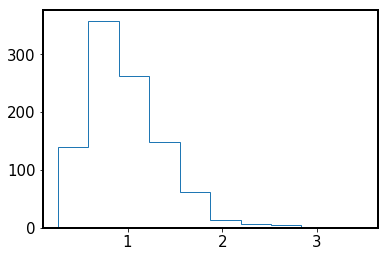

In [291]:
# Example out / in ... to show that the stochasticity 
# means that different realizations of DRW 
# get a different fit with Celerite ... 
plt.hist(np.array(tauFit)  / tau_in, histtype='step' ) 

#### Simulation 2:  illustrate the adaptative grid <a id='sim2'></a>
[toc](#toc)

[go to code for plot_logP](#plotPosterior) <a id='testPlotting'></a>

[-3.21887582 -4.60517019]
sig_lims: [0.02, 0.7] tau_lims: [1, 1000]
[(-7.8240460108562919, -0.71334988787746489), (-6.9077552789821368, 0.0)]
sigma_fit 0.184185307077 tau_fit 140.620184889
log
sigma_exp= 0.21096047279
tau_exp= 220.756449601


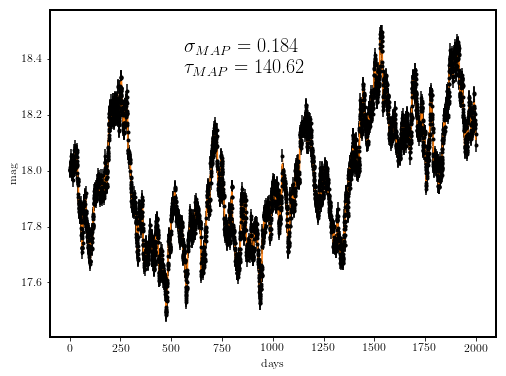

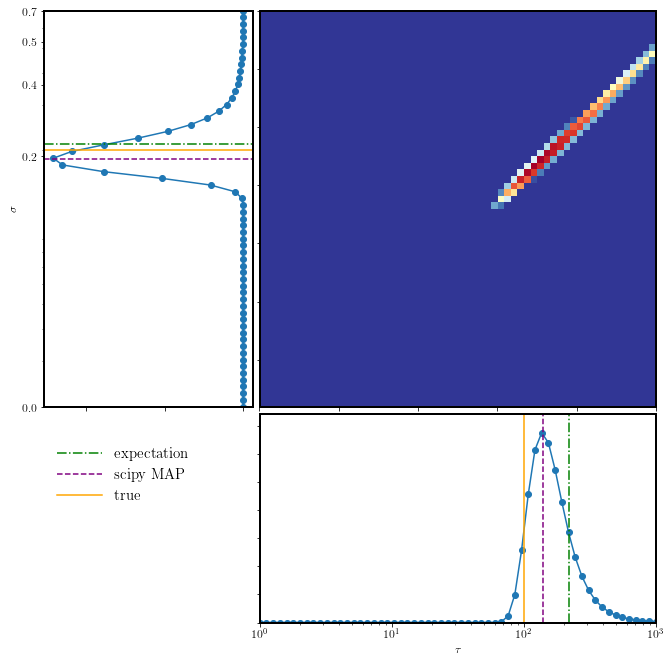

In [261]:
# set the input parameters  for simulated light curve 
sigma_in = 0.2 ; tau_in = 100
SF_inf =  sigma_in * np.sqrt(2)
Npoints  = 200
t = np.sort(np.random.uniform(0,10*tau_in, Npoints)) 
y = mod.sim_DRW_lightcurve(t, SF_inf, tau_in , 18)
yerr = 0.0248 


# find the MAP solution
sig_lims , tau_lims = [0.02,0.7], [1,1000]
sigma_fit, tau_fit,gp = find_celerite_MAP(t,y,yerr, sigma_in, tau_in,prior='Jeff1',
                      set_bounds = True , sig_lims = sig_lims  , 
                      tau_lims =tau_lims,  verbose = True )
plot_gp_prediction(t,y,yerr,gp,sigma_fit, tau_fit)

#evaluate logP on a grid 
Ngrid = 60 
scale = 'log'
sigma_grid , tau_grid= make_grid(scale, sig_lims, tau_lims, Ngrid)
logP = evaluate_logP(sigma_grid, tau_grid,y,gp, prior='Jeff1')

# plot the logP
logP = plot_logP(logP, sigma_grid, tau_grid, sigma_fit, tau_fit,  sigma_in, tau_in,
                scale, verbose=True)



In [259]:
plot_logP?

### How to correctly plot logP : lessons from AstroML <a id='astroMLfigures'></a>
[go to top](#toc)

Test the transpose : what is the correct way to plot logPosterior?  ( see [http://www.astroml.org/book_figures/chapter5/fig_likelihood_uniform.html#book-fig-chapter5-fig-likelihood-uniform]) <a id='2dFunc'></a>

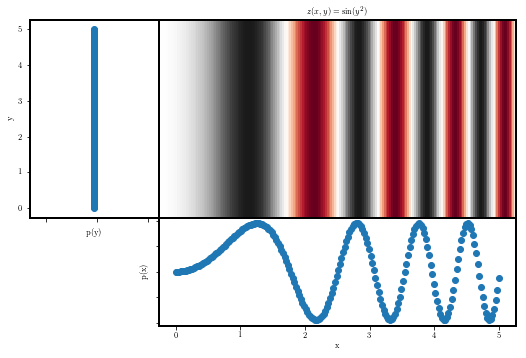

In [20]:
%matplotlib inline
# how it is supposed to look like ...
# just a function of y ... 
def f(x,y):
    return np.sin(y**2.0) 
N = 200
x = np.linspace(0,5, N)
y = np.linspace(0,5, N)
z = np.zeros([N,N], dtype=float)
for i in range(N):
    for j in range(N):
        z[i,j] = f(x[i],y[j]) 
        

fig = plt.figure(figsize=(9, 5))

# need to transpose to make things right ....
# do we ? 
z = z.T  # well, maybe it;s because of how I define z here ? 
# perhaps z is actually z[y,x],not z[x,y ]

# first axis: likelihood contours
ax1 = fig.add_axes((0.4, 0.4, 0.55, 0.55))
ax1.imshow(z, extent=[np.amin(x),np.amax(x), 
                      np.amin(y), np.amax(y)],origin='lower',
           cmap='RdGy', interpolation='none', aspect='auto')
ax1.xaxis.set_major_formatter(plt.NullFormatter())
ax1.yaxis.set_major_formatter(plt.NullFormatter())
ax1.set_title(r'$z(x,y) = \sin(y^{2})$')

p_y = z.sum(1)
dy = y[1]-y[0]
p_y /= p_y.sum() * (dy)
# [*left*, *bottom*, *width*,*height*] 
ax2 = fig.add_axes((0.2, 0.4, 0.2, 0.55))
ax2.xaxis.set_major_formatter(plt.NullFormatter())
ax2.scatter(p_y,y)
ax2.set_xlabel('p(y)')
ax2.set_ylabel('y')

p_x = z.sum(0)
dx = x[1]-x[0]
p_x /= p_x.sum() * (dx)
ax3 = fig.add_axes((0.4, 0.1, 0.55, 0.3))
ax3.yaxis.set_major_formatter(plt.NullFormatter())
ax3.scatter(x,p_x)
ax3.set_ylabel('p(x)')
ax3.set_xlabel('x')

AstroML Fig. 5.12 http://www.astroml.org/book_figures/chapter5/fig_likelihood_uniform.html#book-fig-chapter5-fig-likelihood-uniform : <a id='fig5.12'></a>

In [284]:
pwd

'/Users/chris/GradResearch/Paper2_SDSS_PTF_PS1/code'

data extent: 0.0469547619255 9.88373838059


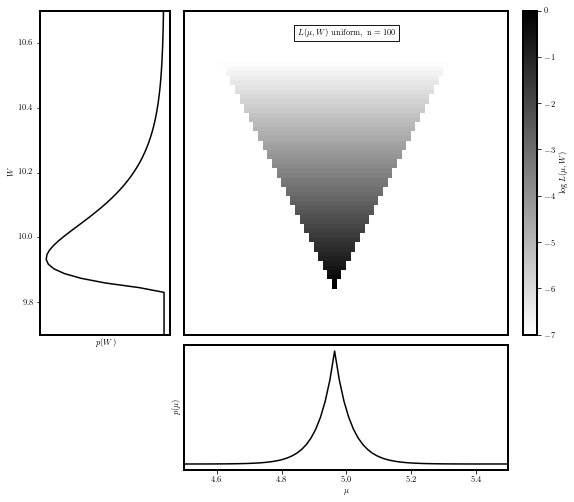

In [19]:
import numpy as np
from matplotlib import pyplot as plt

#----------------------------------------------------------------------
# This function adjusts matplotlib settings for a uniform feel in the textbook.
# Note that with usetex=True, fonts are rendered with LaTeX.  This may
# result in an error if LaTeX is not installed on your system.  In that case,
# you can set usetex to False.
from astroML.plotting import setup_text_plots
setup_text_plots(fontsize=8, usetex=True)


def uniform_logL(x, W, mu):
    """Equation 5.76:"""
    xmin = np.min(x)
    xmax = np.max(x)
    n = x.size

    res = np.zeros(mu.shape, dtype=float) - (n + 1) * np.log(W)
    res[(abs(xmin - mu) > 0.5 * W) | (abs(xmax - mu) > 0.5 * W)] = -np.inf

    return res

#------------------------------------------------------------
# Define the grid and compute logL
W = np.linspace(9.7, 10.7, 70)
mu = np.linspace(4.5, 5.5, 70)

np.random.seed(0)
x = 10 * np.random.random(100)

logL = uniform_logL(x, W[:, None], mu)
logL -= logL.max()

#------------------------------------------------------------
# Compute marginal likelihoods
n = x.size

p_mu = np.exp(logL).sum(0)
Wmin = x.max() - x.min()
p_W = (W - Wmin) / W ** (n + 1)
p_W[W < Wmin] = 0
p_W /= p_W.sum()

#------------------------------------------------------------
# Plot the results
fig = plt.figure(figsize=(10, 7.5))

# 2D likelihood plot
ax = fig.add_axes([0.35, 0.35, 0.45, 0.6], xticks=[], yticks=[])
logL[logL < -10] = -10  # truncate for clean plotting
plt.imshow(logL, origin='lower',
           extent=(mu[0], mu[-1], W[0], W[-1]),
           cmap=plt.cm.binary,
           aspect='auto')

# colorbar
cax = plt.axes([0.82, 0.35, 0.02, 0.6])
cb = plt.colorbar(cax=cax)
cb.set_label(r'$\log L(\mu, W)$')
plt.clim(-7, 0)

ax.text(0.5, 0.93, r'$L(\mu,W)\ \mathrm{uniform,\ n=100}$',
        bbox=dict(ec='k', fc='w', alpha=0.9),
        ha='center', va='center', transform=ax.transAxes)
ax.set_xlim(4.5, 5.5)
ax.set_ylim(9.7, 10.7)

ax1 = fig.add_axes([0.35, 0.1, 0.45, 0.23], yticks=[])
ax1.plot(mu, p_mu, '-k')
ax1.set_xlabel(r'$\mu$')
ax1.set_ylabel(r'$p(\mu)$')
ax1.set_xlim(4.5, 5.5)

ax2 = fig.add_axes([0.15, 0.35, 0.18, 0.6], xticks=[])
ax2.plot(p_W, W, '-k')
ax2.set_xlabel(r'$p(W)$')
ax2.set_ylabel(r'$W$')
ax2.set_xlim(ax2.get_xlim()[::-1])  # reverse x axis
ax2.set_ylim(9.7, 10.7)

print("data extent:", min(x), max(x))

plt.show()




And check out Fig. 5.22 : http://www.astroml.org/book_figures/chapter5/fig_cauchy_mcmc.html#book-fig-chapter5-fig-cauchy-mcmc <a id='fig5.22'></a>

 [-----------------100%-----------------] 50000 of 50000 complete in 4.1 sec

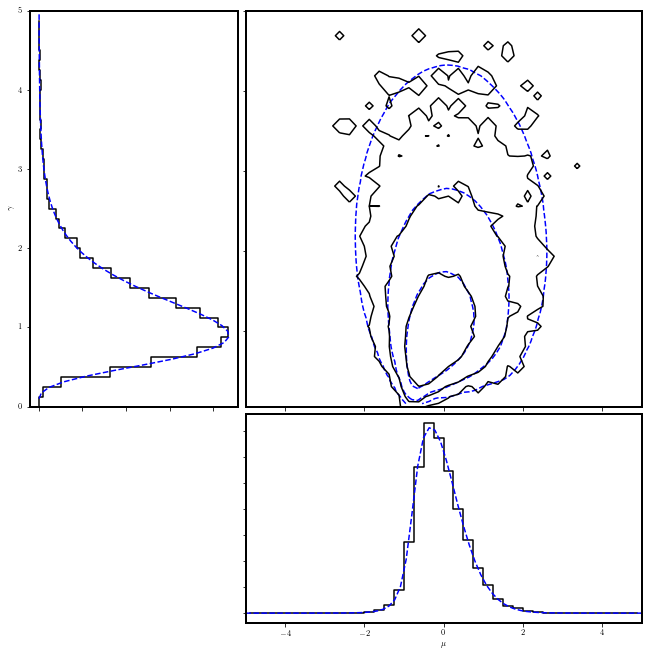

In [44]:
# Author: Jake VanderPlas
# License: BSD
#   The figure produced by this code is published in the textbook
#   "Statistics, Data Mining, and Machine Learning in Astronomy" (2013)
#   For more information, see http://astroML.github.com
#   To report a bug or issue, use the following forum:
#    https://groups.google.com/forum/#!forum/astroml-general
import numpy as np
from scipy.stats import cauchy
from matplotlib import pyplot as plt
from astroML.plotting.mcmc import convert_to_stdev

# this fixes a problem when using older versions of pymc with newer
# versions of scipy
import scipy
scipy.derivative = scipy.misc.derivative
import pymc

#----------------------------------------------------------------------
# This function adjusts matplotlib settings for a uniform feel in the textbook.
# Note that with usetex=True, fonts are rendered with LaTeX.  This may
# result in an error if LaTeX is not installed on your system.  In that case,
# you can set usetex to False.
from astroML.plotting import setup_text_plots
setup_text_plots(fontsize=8, usetex=True)


def cauchy_logL(xi, sigma, mu):
    """Equation 5.74: cauchy likelihood"""
    xi = np.asarray(xi)
    n = xi.size
    shape = np.broadcast(sigma, mu).shape

    xi = xi.reshape(xi.shape + tuple([1 for s in shape]))

    return ((n - 1) * np.log(sigma)
            - np.sum(np.log(sigma ** 2 + (xi - mu) ** 2), 0))


#----------------------------------------------------------------------
# Draw the sample from a Cauchy distribution
np.random.seed(44)
mu_0 = 0
gamma_0 = 2
xi = cauchy(mu_0, gamma_0).rvs(10)

#----------------------------------------------------------------------
# Perform MCMC:

# set up our Stochastic variables, mu and gamma
mu = pymc.Uniform('mu', -5, 5)
log_gamma = pymc.Uniform('log_gamma', -10, 10, value=0)


@pymc.deterministic
def gamma(log_gamma=log_gamma):
    return np.exp(log_gamma)

# set up our observed variable x
x = pymc.Cauchy('x', mu, gamma, observed=True, value=xi)

# set up our model dictionary
model = dict(mu=mu, log_gamma=log_gamma, gamma=gamma, x=x)

# perform the MCMC
S = pymc.MCMC(model)
S.sample(iter=50000, burn=5000)

# extract the traces we're interested in
trace_mu = S.trace('mu')[:]
trace_gamma = S.trace('gamma')[:]

# compute histogram of results to plot below
L_MCMC, mu_bins, gamma_bins = np.histogram2d(trace_mu, trace_gamma,
                                             bins=(np.linspace(-5, 5, 41),
                                                   np.linspace(0, 5, 41)))
L_MCMC[L_MCMC == 0] = 1E-16  # prevents zero-division errors

#----------------------------------------------------------------------
# Compute likelihood analytically for comparison
mu = np.linspace(-5, 5, 70)
gamma = np.linspace(0.1, 5, 70)
logL = cauchy_logL(xi, gamma[:, np.newaxis], mu)
logL -= logL.max()

p_mu = np.exp(logL).sum(0)
p_mu /= p_mu.sum() * (mu[1] - mu[0])

p_gamma = np.exp(logL).sum(1)
p_gamma /= p_gamma.sum() * (gamma[1] - gamma[0])

hist_mu, bins_mu = np.histogram(trace_mu, bins=mu_bins, normed=True)
hist_gamma, bins_gamma = np.histogram(trace_gamma, bins=gamma_bins,
                                      normed=True)


#----------------------------------------------------------------------
# plot the results
fig = plt.figure(figsize=(10,10))

# first axis: likelihood contours
ax1 = fig.add_axes((0.4, 0.4, 0.55, 0.55))
ax1.xaxis.set_major_formatter(plt.NullFormatter())
ax1.yaxis.set_major_formatter(plt.NullFormatter())

ax1.contour(mu, gamma, convert_to_stdev(logL),
            levels=(0.683, 0.955, 0.997),
            colors='b', linestyles='dashed')

ax1.contour(0.5 * (mu_bins[:-1] + mu_bins[1:]),
            0.5 * (gamma_bins[:-1] + gamma_bins[1:]),
            convert_to_stdev(np.log(L_MCMC.T)),
            levels=(0.683, 0.955, 0.997),
            colors='k')

# second axis: marginalized over mu
ax2 = fig.add_axes((0.1, 0.4, 0.29, 0.55))
ax2.xaxis.set_major_formatter(plt.NullFormatter())
ax2.plot(hist_gamma, 0.5 * (bins_gamma[1:] + bins_gamma[:-1]
                            - bins_gamma[1] + bins_gamma[0]),
         '-k', drawstyle='steps')
ax2.plot(p_gamma, gamma, '--b')
ax2.set_ylabel(r'$\gamma$')
ax2.set_ylim(0, 5)

# third axis: marginalized over gamma
ax3 = fig.add_axes((0.4, 0.1, 0.55, 0.29))
ax3.yaxis.set_major_formatter(plt.NullFormatter())
ax3.plot(0.5 * (bins_mu[1:] + bins_mu[:-1]), hist_mu,
         '-k', drawstyle='steps-mid')
ax3.plot(mu, p_mu, '--b')
ax3.set_xlabel(r'$\mu$')
plt.xlim(-5, 5)

plt.show()

### Try the MCMC method .... <a id='tryMCMC'></a>
[go to top](#toc)

I'm essentially using here the emcee implementation of MCMC from http://dfm.io/emcee/current/user/line/#results 
http://dfm.io/emcee/current/user/quickstart/

[-3.21887582 -4.60517019]
sig_lims: [0.02, 0.7] tau_lims: [1, 1000]
[(-7.8240460108562919, -0.71334988787746489), (-6.9077552789821368, 0.0)]
MAP 
sigma_fit 0.129212940917 tau_fit 81.0055222005
Running burn-in...
Running production...
Done


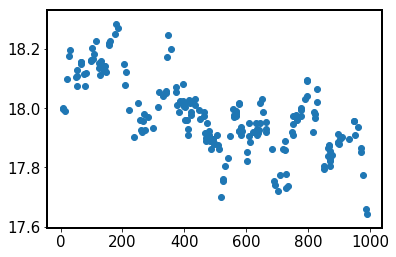

In [41]:
# set the input parameters  for simulated light curve 
sigma_in = 0.2 ; tau_in = 100
SF_inf =  sigma_in * np.sqrt(2)
Npoints  = 200
t = np.sort(np.random.uniform(0,10*tau_in, Npoints)) 
y = mod.sim_DRW_lightcurve(t, SF_inf, tau_in , 18)
yerr = 0.0248 
plt.scatter(t, y)

verbose = True ; set_bounds = True  ; prior = 'Jeff2'
sig_lims , tau_lims = [0.02,0.7], [1,1000]

# Find MAP solution with Celerite 
log_a, log_c =  2 * np.log(sigma_in),np.log(1.0/tau_in) 
truths = [log_a, log_c]

kernel = terms.RealTerm(log_a =log_a , 
                            log_c = log_c)
gp = celerite.GP(kernel, mean=np.mean(y))
gp.compute(t, yerr)

# set initial params 
initial_params = gp.get_parameter_vector()
if verbose:
    print(initial_params)

# set boundaries 
if set_bounds:
    if verbose : 
        print('sig_lims:', sig_lims, 'tau_lims:', tau_lims)
    tau_bounds, sigma_bounds = tau_lims, sig_lims
    loga_bounds = (2*np.log(min(sigma_bounds)), 
                   2*np.log(max(sigma_bounds))
                  )

    logc_bounds= (np.log(1/max(tau_bounds)), 
                  np.log(1/ min(tau_bounds))
                 )
    bounds = [loga_bounds, logc_bounds]

else : # - inf to + inf 
    bounds = gp.get_parameter_bounds()
if verbose :
    print(bounds)

# wrap the neg_log_posterior for a chosen prior 
def neg_log_like(params,y,gp):
    return neg_log_posterior(params,y,gp,prior)

# find MAP solution 
r = minimize(neg_log_like, initial_params, 
         method="L-BFGS-B", bounds=bounds, args=(y, gp))
gp.set_parameter_vector(r.x)
res = gp.get_parameter_dict()

tau_fit = np.exp(-res['kernel:log_c'])
sigma_fit = np.exp(res['kernel:log_a']/2)
if verbose : 
    print('MAP ')
    print('sigma_fit', sigma_fit,'tau_fit', tau_fit)


# wrap the neg_log_posterior for this 
def log_probability(params,y,gp,prior):
    return -neg_log_posterior(params,y,gp,prior)

# set the initial chain position on the MAP value 
initial = np.array(r.x)
ndim, nwalkers = len(initial), 32

sampler = emcee.EnsembleSampler(nwalkers, ndim,  log_probability,
                               args=(y,gp,prior))


print("Running burn-in...")
p0 = initial + 1e-8 * np.random.randn(nwalkers, ndim)
p0, lp, _ = sampler.run_mcmc(p0, 500)

print("Running production...")
sampler.reset()
sampler.run_mcmc(p0, 2000);
print("Done")

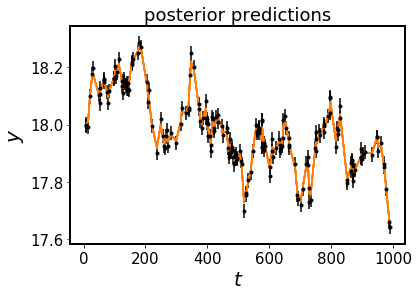

In [42]:
%matplotlib inline
# Plot the data.
plt.errorbar(t, y, yerr=yerr, fmt=".k", capsize=0)
color = "#ff7f0e"
# Plot 24 posterior samples.
samples = sampler.flatchain

# Store the chains 
np.savetxt('mcmc_test.txt',samples )

# to load the chains 
#s = np.loadtxt('mcmc_test.txt')

for s in samples[np.random.randint(len(samples), size=24)]:
    gp.set_parameter_vector(s)
    mu = gp.predict(y, t, return_cov=False)
    plt.plot(t, mu, color=color, alpha=0.3)

plt.ylabel(r"$y$")
plt.xlabel(r"$t$")
#plt.xlim(-5, 5)
plt.gca().yaxis.set_major_locator(plt.MaxNLocator(5))
plt.title("posterior predictions");

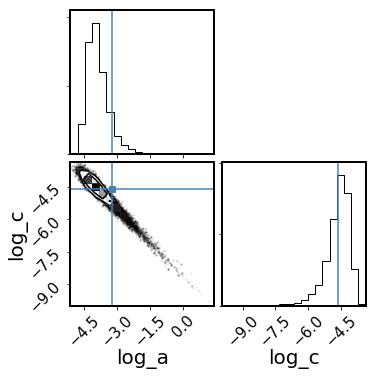

In [48]:
import corner
inds = np.array([0,1])
corner.corner(sampler.flatchain[:, inds], truths=truths,
              labels=['log_a', 'log_c']);

Compare the median (mode) of MCMC samples and the MAP estimate - they are by definition  the same ... ( as well as the 2D maximum of a hard-coded grid evaluation of logPosterior...)

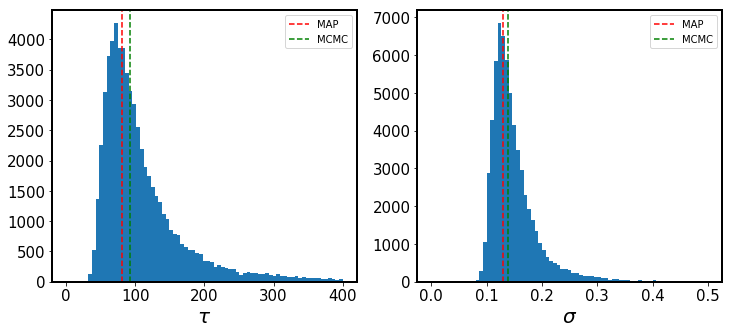

In [49]:
tau_fit = np.exp(-res['kernel:log_c'])
sigma_fit = np.exp(res['kernel:log_a']/2)

# What's the MCMC prediction...
sigma_samples = np.exp(sampler.flatchain[:,0] / 2)
tau_samples = np.exp(-sampler.flatchain[:,1])
fig,ax = plt.subplots(1,2,figsize=(12,5))
ax[0].hist(tau_samples, bins=75, range=(0,400))
ax[0].axvline(tau_fit, ls='--', c='red', label='MAP')
ax[0].axvline(np.median(tau_samples), ls='--',c='green', label='MCMC')
ax[0].legend()
ax[0].set_xlabel(r'$\tau$')
ax[1].hist(sigma_samples, bins=75,range=(0,0.5))
ax[1].axvline(sigma_fit, ls='--', c='red', label='MAP')
ax[1].axvline(np.median(sigma_samples), ls='--',c='green', label='MCMC')
ax[1].legend()
ax[1].set_xlabel(r'$\sigma$')

So they are different, but pretty close. Since I know that MAP is biased low, and in this particular example MCMC retrieves the correct value, I wonder whether using MCMC for all light curves would not provide a better result.... 

MCMC : concerned with sampling,  while  MAP : concerned with optimization (finding the maximum of the logPosterior)

In [51]:
# Here I extract the 16th, 50th (median), 84th percentiles 
# from the MCMC chains ( following DFM "my favorite is to quote 
# the uncertainties based on the 16th, 50th, and 84th percentiles 
# of the samples in the marginalized distributions")

log_a,log_c = map(lambda v: (v[1], v[2]-v[1], v[1]-v[0]),
                             zip(*np.percentile(sampler.flatchain[:, inds]
                                                , [16, 50, 84],
                                                axis=0)))

tau_MCMC_mode, tau_hi, tau_lo = np.exp(-np.asarray(log_c))
sigma_MCMC_mode ,sigma_hi, sigma_lo= np.exp(np.asarray(log_a)/2)

print('the MCMC result for tau is ', tau_MCMC_mode, '+', tau_hi, '-', tau_lo)
print('the MCMC result for sigma is ', sigma_MCMC_mode, '+', sigma_hi, '-', sigma_lo)

the MCMC result for tau is  93.1890616356 + 0.673868429273 - 0.565934594566
the MCMC result for sigma is  0.138060598603 + 1.31232336463 - 1.19647364764


Very useful tutorial actually showing the MAP vs MCMC difference https://github.com/dfm/emcee/blob/master/docs/tutorials/line.rst 

Overall, it would be useful to see the full MCMC results for the S82 LCs 

In [52]:
# In theory this would help figure out where the chain forgot where it started... 
# sampler.get_autocorr_time()
#flat_samples = sampler.get_chain(discard=100, thin=15, flat=True)

### Simulation 3 <a id='sim3'></a>
[go to top](#toc)

Test the dependence of shape of  logP on  number of points.   Make sure that it's THE SAME stochastic process 

In [171]:
np.save?

In [253]:
# set the input parameters  for simulated light curve 
sigma_in = 0.2 ; tau_in = 100
SF_inf =  sigma_in * np.sqrt(2)
Npoints  = 4000
# I simulate with very good sampling : 
# 4 per day 
t = np.sort(np.random.uniform(0,20*tau_in, Npoints)) 
y = mod.sim_DRW_lightcurve(t, SF_inf, tau_in , 18)
yerr = 0.0248 
lc = {'t':t, 'y':y, 'yerr':yerr}
np.save('test_ls_tau-100_sigma-0.2_N-4000', lc)

4000  points
1000  points
400  points
200  points
100  points
50  points


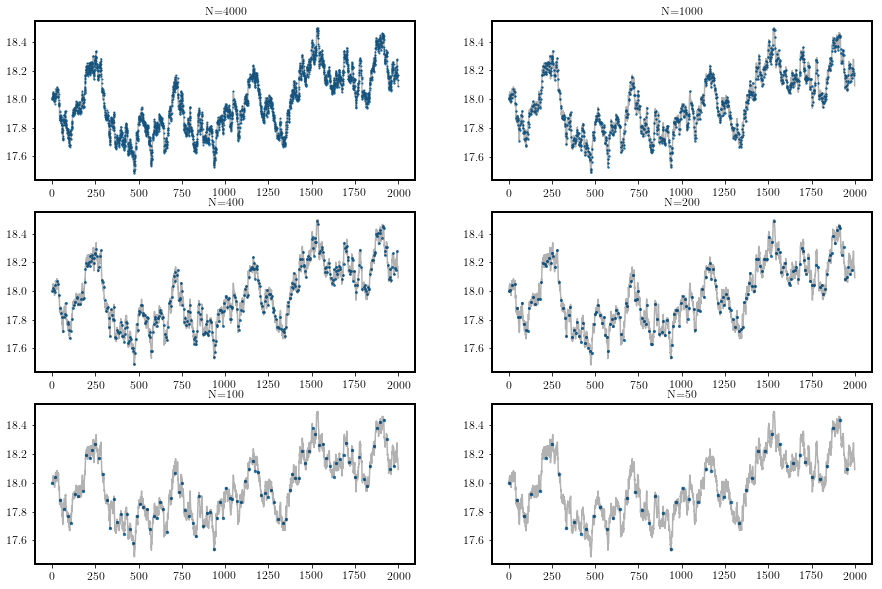

In [254]:
from astroML.plotting import setup_text_plots
setup_text_plots(fontsize=12, usetex=True)
# show subsequent subsamplings ... 
# since the original epochs 
# were chosen from random distribution,
# choosing every Nth epoch 
# doesn't turn it into a regular sampling problem 
fig,axs = plt.subplots(3,2, figsize=(15,10))
ax = np.ravel(axs)

i=0
for sub in [1,4,10,20,40,80]:
    ax[i].scatter(t[::sub], y[::sub],s=1+i)
    ax[i].plot(t,y,"k", lw=1.5, alpha=0.3)
    N = len(t[::sub])
    ax[i].set_title('N='+str(N))
    print(len(t[::sub]), ' points')
    i+=1 

plt.savefig('test_ls_tau-100_sigma-0.2_N-4000_sampling.png', bbox_inches='tight')

In [255]:
# First : see how subsampling affects the MAP prediction ....
sig_lims , tau_lims = [0.02,0.7], [1,1000]
for sub in [1,4,10,20,40,80]:
    sigma_fit, tau_fit,gp = find_celerite_MAP(t[::sub],y[::sub],
                            yerr, sigma_in, tau_in,prior='Jeff1',
                      set_bounds = True , sig_lims = sig_lims  , 
                      tau_lims =tau_lims,verbose = True )

TypeError: find_celerite_MAP() got an unexpected keyword argument 'plot_prediction'

Plot logP with wider boundaries : 

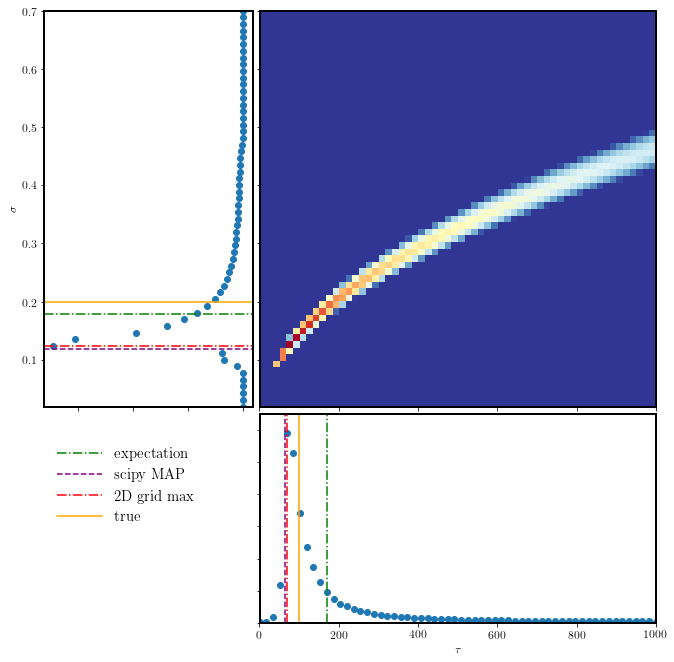

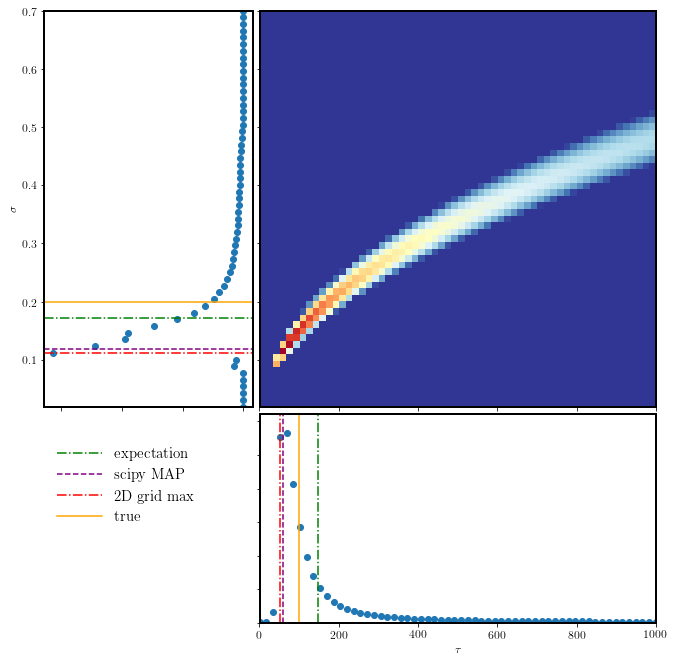

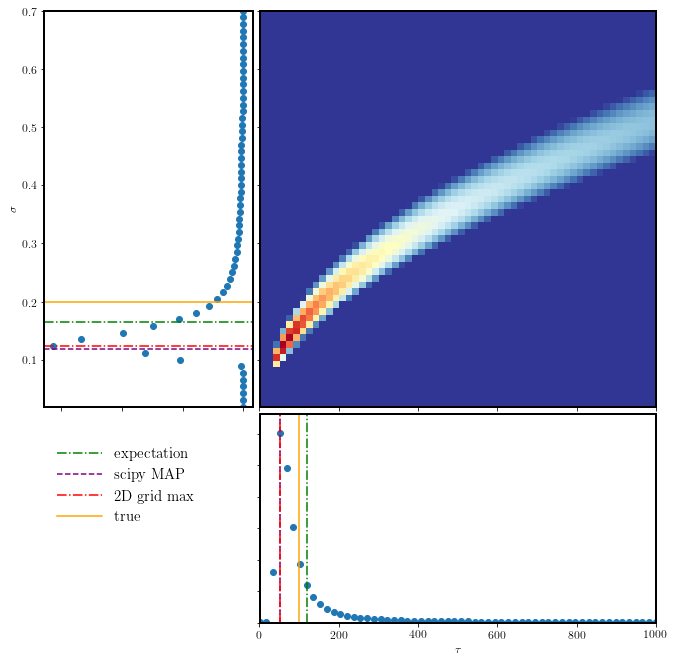

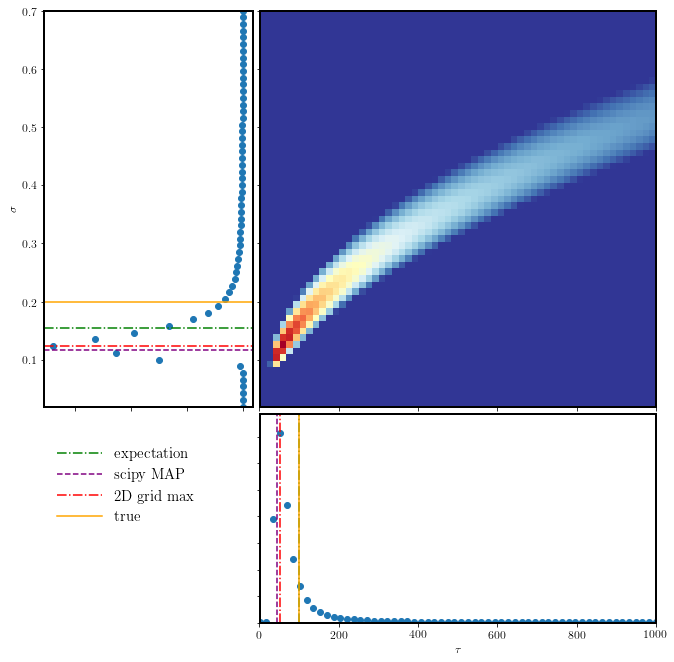

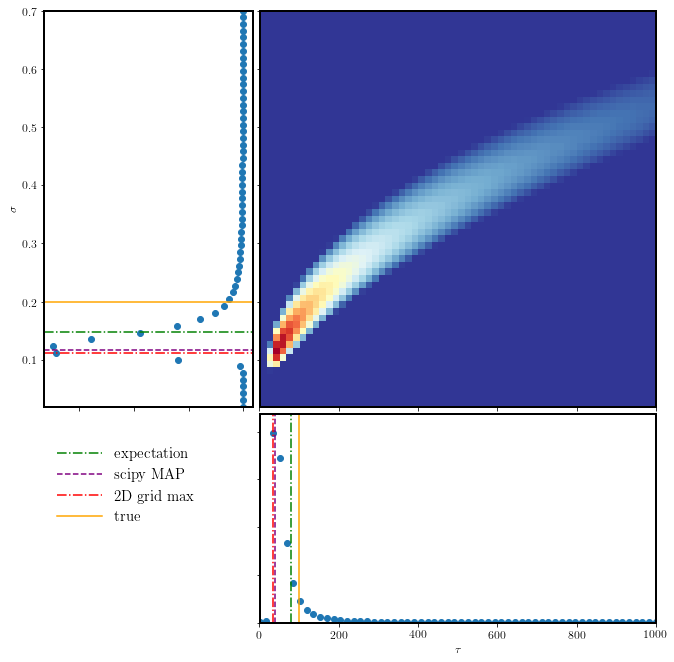

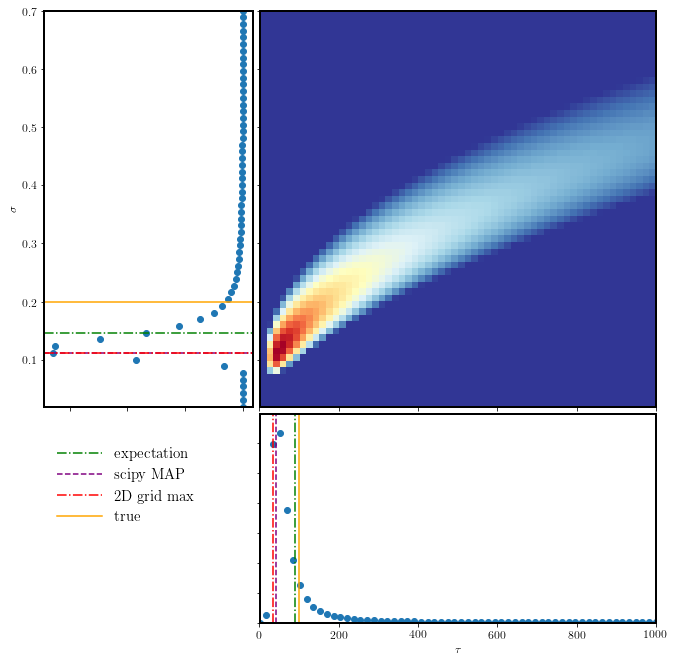

In [183]:
sig_lims , tau_lims = [0.02,0.7], [1,1000]
# Second, plot the logP for each subsampling, see if it makes things better / worse ... 
for sub in [1,4,10,20,40,80]:
    # evaluate logP on a grid 
    Ngrid = 60 
    sigma_grid = np.linspace(sig_lims[0], sig_lims[1],Ngrid )
    tau_grid  = np.linspace(tau_lims[0], tau_lims[1], Ngrid)
    
    t_sub, y_sub = t[::sub],y[::sub]
    sigma_fit, tau_fit,gp = find_celerite_MAP(t_sub, y_sub,
                            yerr, sigma_in, tau_in,prior='Jeff2',
                      set_bounds = True , sig_lims = sig_lims  , 
                      tau_lims =tau_lims, 
                      plot_prediction=False, verbose = False )
    
    logP = evaluate_logP(sigma_grid, tau_grid,y_sub,gp, prior='Jeff2')

    # plot the logP
    plot_logP(logP, sigma_grid, tau_grid, sigma_fit, tau_fit,  sigma_in, tau_in)




Plot narrower boundaries 

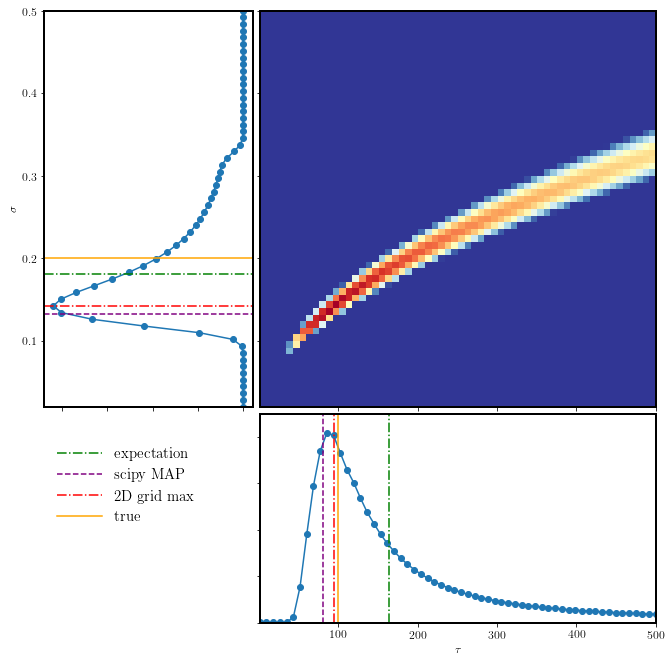

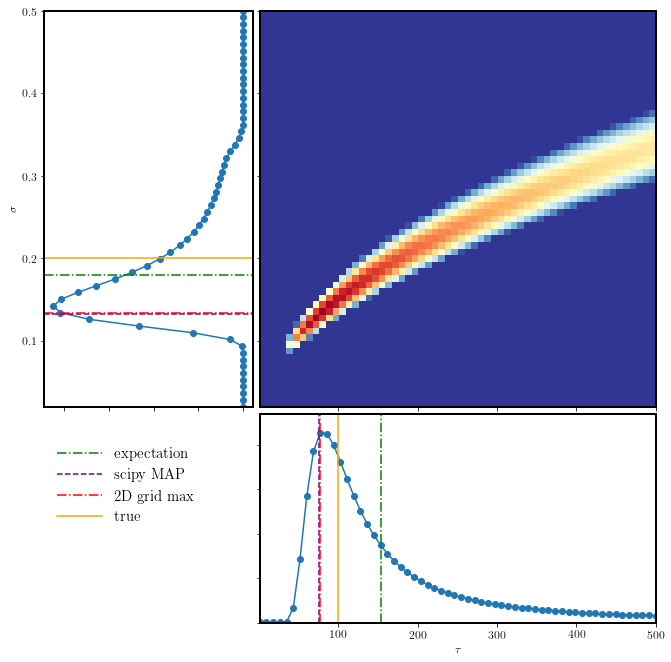

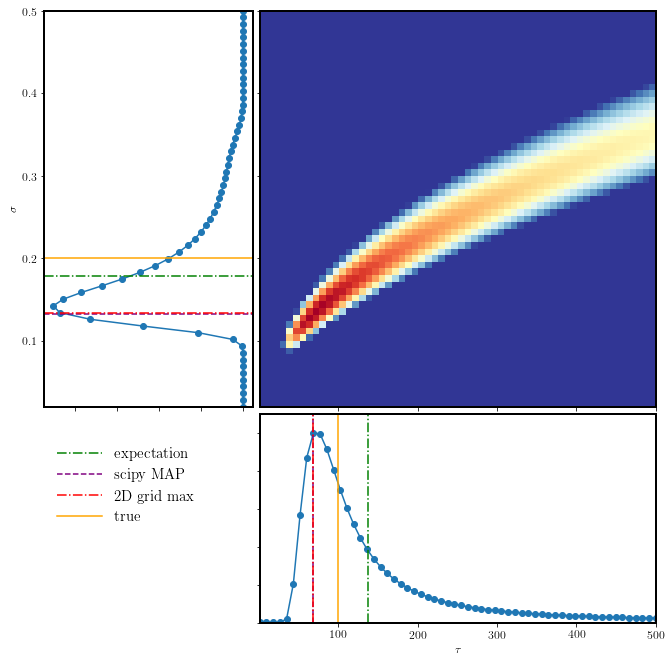

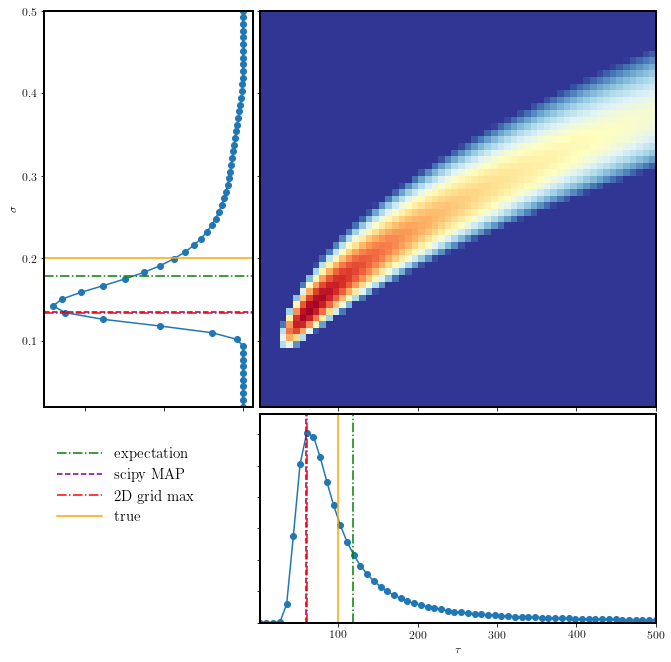

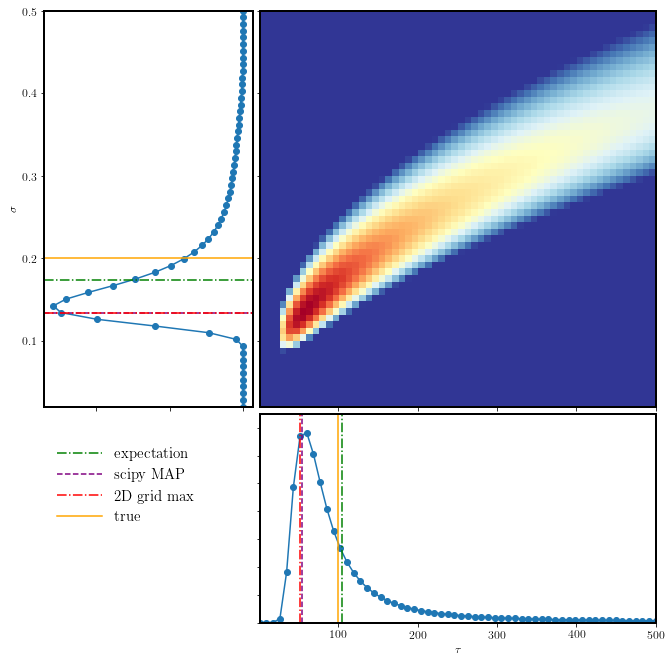

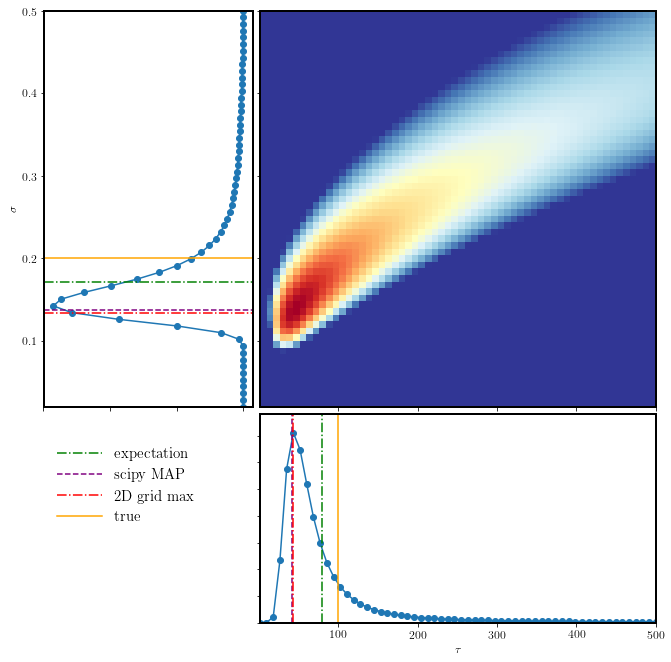

In [77]:
sig_lims , tau_lims = [0.02,0.5], [1,500]
# Second, plot the logP for each subsampling, see if it makes things better / worse ... 
for sub in [1,4,10,20,40,80]:
    # evaluate logP on a grid 
    Ngrid = 60 
    sigma_grid = np.linspace(sig_lims[0], sig_lims[1],Ngrid )
    tau_grid  = np.linspace(tau_lims[0], tau_lims[1], Ngrid)
    
    t_sub, y_sub = t[::sub],y[::sub]
    sigma_fit, tau_fit,gp = find_celerite_MAP(t_sub, y_sub,
                            yerr, sigma_in, tau_in,prior='Jeff2',
                      set_bounds = True , sig_lims = sig_lims  , 
                      tau_lims =tau_lims, 
                      plot_prediction=False, verbose = False )
    
    logP = evaluate_logP(sigma_grid, tau_grid,y_sub,gp, prior='Jeff2')

    # plot the logP
    plot_logP(logP, sigma_grid, tau_grid, sigma_fit, tau_fit,  sigma_in, tau_in)





As we see, all that changes is that the logP surface becomes narrower for a better sampled DRW light curve . 

### Simulation 4 : take one of the DRWs that Zeljko made earlier, confirm that we get the same answer <a id='sim4'></a>
[go to top](#toc)

Test the example from GradResearch/DRW_Celerite/code/DRW_analyze_logL.ipynb , the same light curve 

In [335]:
imp.reload(mod)

<module 'modules' from '/Users/chris/GradResearch/Paper2_SDSS_PTF_PS1/code/modules.py'>

[-3.21887582 -4.60517019]
sig_lims: [0.01, 1.1] tau_lims: [1, 10000]
[(-9.2103403719761818, 0.19062035960864987), (-9.2103403719761818, 0.0)]
sigma_fit 0.168977639532 tau_fit 67.3368907229
sigma_exp= 0.182976884994
tau_exp= 86.8524632904


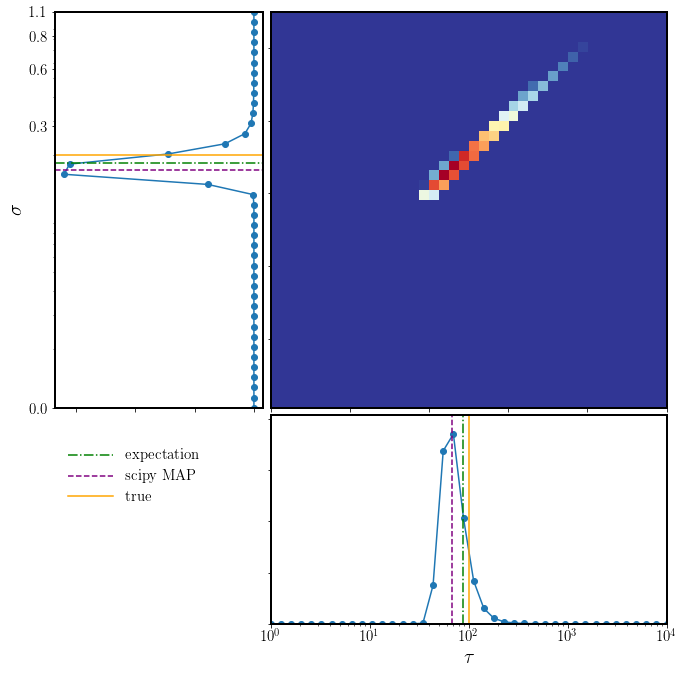

In [341]:
DirIn = '/Users/chris/GradResearch/DRW_Celerite/raw_data/DRWtestCeleriteZI/'
fname = 'DRWtestCeleriteZI_LC737.dat'
lc = Table.read(DirIn +fname, format='ascii', 
                names=['time', 'mag', 'err'] )    
t,y,yerr = lc['time'], lc['mag'], lc['err']

sigma_in, tau_in = 0.2, 100 # the input is set , as in N0_evaluate_logL.ipynb in 
                            # /Users/chris/GradResearch/DRW_Celerite/code/
# find the MAP 
sig_lims = [0.01, 1.1]
tau_lims = [1,10000]
prior = 'Jeff2'
sigma_fit, tau_fit,gp = find_celerite_MAP(t,y,
                            yerr, sigma_in, tau_in,prior,
                      set_bounds = True , sig_lims = sig_lims  , 
                      tau_lims =tau_lims
                   , verbose = True )

Ngrid = 40 ; scale='log'
sigma_grid, tau_grid = mod.make_grid(scale,sig_lims, tau_lims,Ngrid) 
logP = mod.evaluate_logP(sigma_grid, tau_grid,y,gp,prior)

# plot the logP
logP, sigma_exp, tau_exp  = mod.plot_logP(logP, sigma_grid, 
                           tau_grid, sigma_fit, tau_fit,  
                           sigma_in, tau_in, scale,verbose=True)



Ok, so at least this is consistent - the maximum of logL is in a different place than the input params. just like in Fig.1 of Kozlowski_2017. He's also using logarithmic scale in tau, which translates into logarithmic in sigma_hat , even if sigma is linear. The logarithmic scale in his figure makes it seem that the discrepancy is smaller than it is.   

### Fit all light curves 

In [343]:
import os 
DirIn = '/Users/chris/GradResearch/DRW_Celerite/raw_data/DRWtestCeleriteZI/'
files = os.listdir(DirIn)


results =  {}
for prior in ['Jeff1', 'Jeff2', 'None']:
        results[prior] = {'sigma_MAP':np.zeros(len(files), dtype=float),
                           'tau_MAP':np.zeros(len(files), dtype=float),
                          'sigma_EXP':np.zeros(len(files), dtype=float),
                           'tau_EXP':np.zeros(len(files), dtype=float)}

sig_lims = [0.01, 1]
tau_lims = [1,1000]
for i in range(len(files)):
    fname = files[i]
    if i % 10 == 0 :
        print(i)
    lc = Table.read(DirIn +fname, format='ascii', 
                    names=['time', 'mag', 'err'] )    
    t,y,yerr = lc['time'], lc['mag'], lc['err']
    sigma_in = 0.2 ; tau_in = 100 
    for prior in ['Jeff1', 'Jeff2', 'None'] : 
        
        # find MAP 
        sigma_fit, tau_fit,gp = mod.find_celerite_MAP(t,y,yerr, sigma_in, tau_in,
                                    prior,set_bounds=True , sig_lims=sig_lims  , 
                                    tau_lims=tau_lims ,verbose=False)

        # evaluate logP on a grid 
        Ngrid = 60 ; scale = 'log'
        sigma_grid, tau_grid = mod.make_grid(scale,sig_lims, tau_lims,Ngrid) 
        logP = mod.evaluate_logP(sigma_grid, tau_grid,y,gp,prior)

        # find expectation value 
        sigma_exp, tau_exp = mod.find_expectation_value(logP, sigma_grid, 
                                    tau_grid)
        
        results[prior]['sigma_MAP'][i] = sigma_fit
        results[prior]['sigma_EXP'][i] = sigma_exp
        
        results[prior]['tau_MAP'][i] = tau_fit
        results[prior]['tau_EXP'][i] = tau_exp
        


0
10
20
30
40
50
60
70
80
90
100
110
120
130
140
150
160
170
180
190
200
210
220
230
240
250
260
270
280
290
300
310
320
330
340
350
360
370
380
390
400
410
420
430
440
450
460
470
480
490
500
510
520
530
540
550
560
570
580
590
600
610
620
630
640
650
660
670
680
690
700
710
720
730
740
750
760
770
780
790
800
810
820
830
840
850
860
870
880
890
900
910
920
930
940
950
960
970
980
990


In [ ]:
# fit the same light curves finding the expectation value of the brute force method 
# logP -= logP.max() # subtact the maximum to avoid overflow 
    
# p_sigma = np.exp(logP).sum(1) # no need to normalize : just plotting .... 
# p_sigma /= p_sigma.sum() * (sigma_grid[1] - sigma_grid[0])
# sigma_exp = find_expectation_value(sigma_grid, p_sigma )

# p_tau = np.exp(logP).sum(0)
# p_tau /= p_tau.sum() * (tau_grid[1] - tau_grid[0])
# tau_exp = find_expectation_value(tau_grid, p_tau )



In [345]:
np.save('fitting_1000_LCs_results', results)

In [348]:
#results

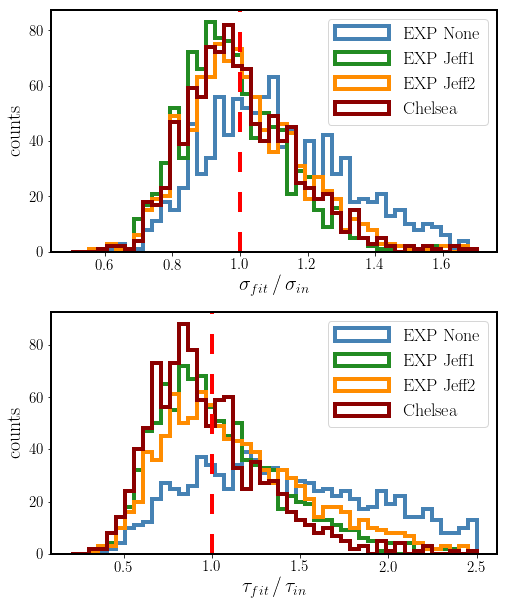

In [349]:
# plot histograms : marginalize along either dimension ... 

fig ,ax  = plt.subplots(2,1,figsize=(8,10))

nbins=45
x0 = [0.2,0.62]
method = 'EXP'  # or MAP 
colors= {'None':'steelblue', 'Jeff1':'forestgreen', 'Jeff2':'darkorange' }
for prior in ['None', 'Jeff1', 'Jeff2']:
    x =  results[prior]['sigma_'+method] / sigma_in
    ax[0].hist(x, label = method+' '+prior, histtype='step', lw=4, bins=nbins,
              color=colors[prior],range=(0.5,1.7))

    y = results[prior]['tau_'+method] / tau_in
    ax[1].hist(y, label=method+' '+prior, histtype='step', lw=4, bins=nbins,
              color=colors[prior],range=(0.2,2.5))

    
# Grab Chelsea' results ...
fits = Table.read('/Users/chris/GradResearch/DRW_Celerite/data_products/Fig_Celerite_ZI_LC_fits/'+'fits.dat', 
                  format='ascii')
tau_fit = np.power(10,fits['col3'].data)
sigma_hat = np.power(10, fits['col4'].data)
sigma_fit = sigma_hat / np.sqrt(2 / (tau_fit/365.0)) 
x =  sigma_fit / sigma_in
ax[0].hist(x, label = 'Chelsea', histtype='step', color='darkred', lw=4, bins=nbins,
          range=(0.5,1.7))

y = tau_fit / tau_in
ax[1].hist(y, label='Chelsea', histtype='step', color='darkred',lw=4, bins=nbins,
           range=(0.2,2.5)
           )


ax[0].set_xlabel(r'$\sigma_{fit}\,/ \,\sigma_{in}$')
ax[1].set_xlabel(r'$\tau_{fit} \,/\, \tau_{in}$')
for i in [0,1]:
    ax[i].legend(fontsize=18)
    ax[i].axvline(1, lw=4, ls='--', c='red', dashes=(5,5))
    ax[i].set_ylabel('counts')
fig.subplots_adjust(hspace=0.25)

#fig.suptitle('N = '+str(len(t))+' pts, length='+str(length)+ r'$ \tau_{in}$'+', dt='+\
#             str(dt)+' days, \n'  + '' \
#                 + 'err='+str(yerr)+' [mag], '+b, fontsize=18)


plt.savefig('Fit_DRW_new'+method+'.png', bbox_inches='tight')
# in each panel , plot histogram of both 

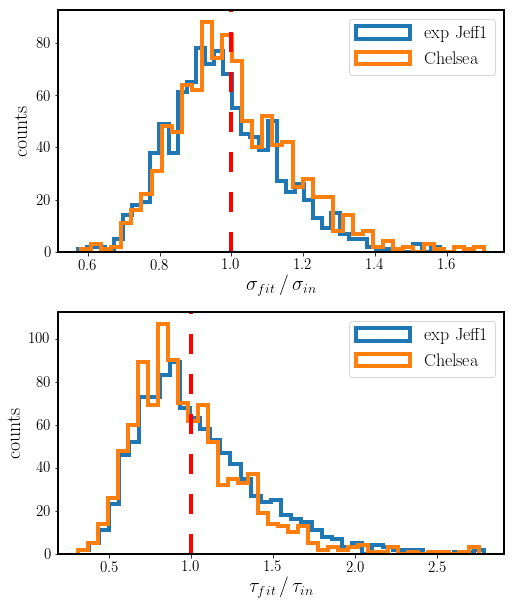

In [350]:
# plot histograms : marginalize along either dimension ... 

fig ,ax  = plt.subplots(2,1,figsize=(8,10))

x0 = [0.2,0.62]
method= 'EXP'
for prior in [ 'Jeff1']:
    x =  results[prior]['sigma_'+method] / sigma_in
    ax[0].hist(x, label = 'exp '+prior, histtype='step', lw=4, bins=40)

    y = results[prior]['tau_'+method] / tau_in
    ax[1].hist(y, label='exp '+prior, histtype='step', lw=4, bins=40)

    
# Grab Chelsea' results ...
fits = Table.read('/Users/chris/GradResearch/DRW_Celerite/data_products/Fig_Celerite_ZI_LC_fits/'+'fits.dat', 
                  format='ascii')
tau_fit = np.power(10,fits['col3'].data)
sigma_hat = np.power(10, fits['col4'].data)
sigma_fit = sigma_hat / np.sqrt(2 / (tau_fit/365.0)) 
x =  sigma_fit / sigma_in
ax[0].hist(x, label = 'Chelsea', histtype='step', lw=4, bins=40)

y = tau_fit / tau_in
ax[1].hist(y, label='Chelsea', histtype='step', lw=4, bins=40)


ax[0].set_xlabel(r'$\sigma_{fit}\,/ \,\sigma_{in}$')
ax[1].set_xlabel(r'$\tau_{fit} \,/\, \tau_{in}$')
for i in [0,1]:
    ax[i].legend(fontsize=18)
    ax[i].axvline(1, lw=4, ls='--', c='red', dashes=(5,5))
    ax[i].set_ylabel('counts')
fig.subplots_adjust(hspace=0.25)

#fig.suptitle('N = '+str(len(t))+' pts, length='+str(length)+ r'$ \tau_{in}$'+', dt='+\
#             str(dt)+' days, \n'  + '' \
#                 + 'err='+str(yerr)+' [mag], '+b, fontsize=18)


plt.savefig('Fit_DRW_exp_nre.png', bbox_inches='tight')
# in each panel , plot histogram of both 

Put MAP and exp, only for Jeff2 prior : 
    
    

median tau ratio   Jeff1 MAP 0.744962761865
median tau ratio   Jeff1 exp 1.06937101791
median tau ratio chelsea  0.908102795676


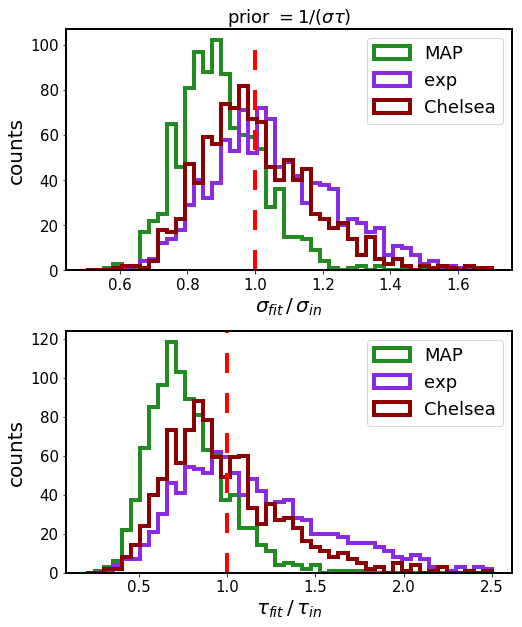

In [89]:
# plot histograms : marginalize along either dimension ... 

fig ,ax  = plt.subplots(2,1,figsize=(8,10))

x0 = [0.2,0.62]
prior = 'Jeff1'
colors= {'None':'steelblue', 'Jeff1':'forestgreen', 'Jeff2':'darkorange' }
colors = {'MAP' : 'forestgreen', 'exp':'blueviolet'}
for method in ['MAP', 'exp']:
    x =  results[prior]['sigma_'+method] / sigma_in
    ax[0].hist(x, label = method, histtype='step', lw=4, bins=nbins,
              color=colors[method], range=(0.5,1.7))

    y = results[prior]['tau_'+method] / tau_in
    ax[1].hist(y, label=method, histtype='step', lw=4, bins=nbins,
              color=colors[method], range=(0.2,2.5))
    print('median tau ratio  ',prior, method, np.median(y))
    
# Grab Chelsea' results ...
fits = Table.read('/Users/chris/GradResearch/DRW_Celerite/data_products/Fig_Celerite_ZI_LC_fits/'+'fits.dat', 
                  format='ascii')
tau_fit = np.power(10,fits['col3'].data)
sigma_hat = np.power(10, fits['col4'].data)
sigma_fit = sigma_hat / np.sqrt(2 / (tau_fit/365.0)) 
x =  sigma_fit / sigma_in
ax[0].hist(x, label = 'Chelsea', histtype='step',color='darkred', lw=4, bins=nbins,
          range=(0.5,1.7))

y = tau_fit / tau_in
print('median tau ratio chelsea ', np.median(y))
ax[1].hist(y, label='Chelsea', histtype='step', color='darkred',lw=4, bins=nbins,
          range=(0.2,2.5))


ax[0].set_xlabel(r'$\sigma_{fit}\,/ \,\sigma_{in}$')
ax[1].set_xlabel(r'$\tau_{fit} \,/\, \tau_{in}$')
for i in [0,1]:
    ax[i].legend(fontsize=18)
    ax[i].axvline(1, lw=4, ls='--', c='red', dashes=(5,5))
    ax[i].set_ylabel('counts')
fig.subplots_adjust(hspace=0.25)

#fig.suptitle('N = '+str(len(t))+' pts, length='+str(length)+ r'$ \tau_{in}$'+', dt='+\
#             str(dt)+' days, \n'  + '' \
#                 + 'err='+str(yerr)+' [mag], '+b, fontsize=18)

ax[0].set_title('prior '+r'$= 1/ (\sigma  \tau)$')
plt.savefig('Fit_DRW_exp.png', bbox_inches='tight')
# in each panel , plot histogram of both 

plot the log likelihood space for one: 

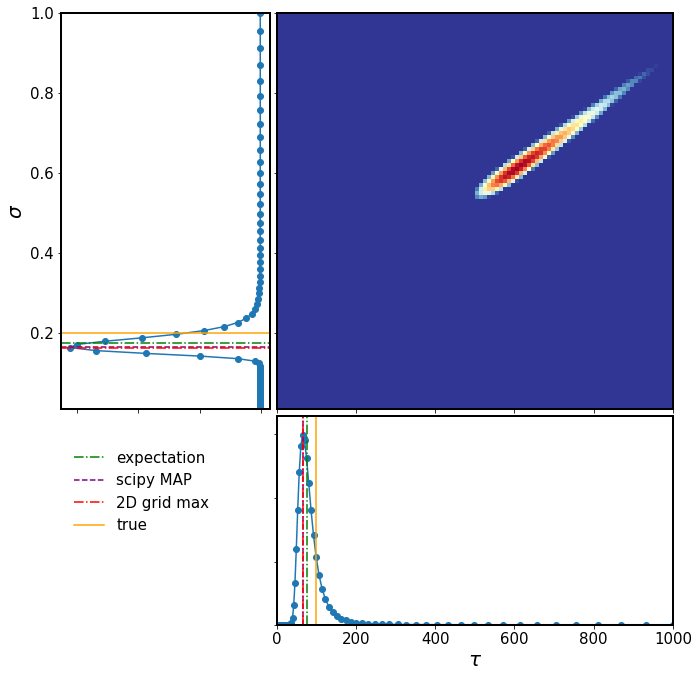

In [54]:
i = 1
fname = files[i]

lc = Table.read(DirIn +fname, format='ascii', 
                names=['time', 'mag', 'err'] )    
t,y,yerr = lc['time'], lc['mag'], lc['err']
sigma_in = 0.2 ; tau_in = 100 
sig_lims = [0.01, 1]
tau_lims = [1,1000]


for prior in ['Jeff1']:# , 'Jeff2', 'None'] : 
    sigma_fit, tau_fit,gp = find_celerite_MAP(t,y,
                                yerr, sigma_in, tau_in,prior=prior,
                          set_bounds = False , sig_lims = sig_lims  , 
                          tau_lims =tau_lims, 
                          plot_prediction=False, verbose = False )
    results[prior]['sigma_MAP'][i] = sigma_fit
    results[prior]['tau_MAP'][i] = tau_fit

    Ngrid = 100 
  
    sigma_grid = np.logspace(np.log10(sig_lims[0]), np.log10(sig_lims[1]),Ngrid )
    tau_grid  = np.logspace(np.log10(tau_lims[0]), np.log10(tau_lims[1]), Ngrid)
    
    logP = evaluate_logP(sigma_grid, tau_grid,y,gp, prior=prior)

    # plot the logP
    plot_logP(logP, sigma_grid, tau_grid, sigma_fit, tau_fit,  sigma_in, tau_in,
             savefig=False)




In [56]:
tau_grid

array([    1.        ,     1.07226722,     1.149757  ,     1.23284674,
           1.32194115,     1.41747416,     1.51991108,     1.62975083,
           1.7475284 ,     1.87381742,     2.009233  ,     2.15443469,
           2.3101297 ,     2.47707636,     2.65608778,     2.84803587,
           3.05385551,     3.27454916,     3.51119173,     3.76493581,
           4.03701726,     4.32876128,     4.64158883,     4.97702356,
           5.33669923,     5.72236766,     6.13590727,     6.57933225,
           7.05480231,     7.56463328,     8.11130831,     8.69749003,
           9.32603347,    10.        ,    10.72267222,    11.49756995,
          12.32846739,    13.21941148,    14.17474163,    15.19911083,
          16.29750835,    17.475284  ,    18.73817423,    20.09233003,
          21.5443469 ,    23.101297  ,    24.77076356,    26.56087783,
          28.48035868,    30.53855509,    32.74549163,    35.11191734,
          37.64935807,    40.37017259,    43.28761281,    46.41588834,
      

### Compare to Chelsea's results

In [24]:
# "I have attached the fits - the first four columns are:

# 1. The light curve filename
# 2. chi^2 of fit
# 3. log(tau) (in days)
# 4. log(sigma-hat) (in mag/sqrt(year))

# The fit parameters are similar to your input, with: 

# $<\tau>$ = 98.5 days 

# $<\sigma> = < SF_{\infty} / \sqrt{2} > = 0.2 $ mag


# The tau is more biased than sigma, since sigma-hat is well-constrained/not biased, 
# while sigma goes as sqrt(tau).

# By the way, the last column list the number of acceptable data points that 
# went into the fit, and sometimes it is <400 because it rejects duplicate MJD values. 
# "

# Grab Chelsea' results ...
fits = Table.read('/Users/chris/GradResearch/DRW_Celerite/data_products/Fig_Celerite_ZI_LC_fits/'+'fits.dat', 
                  format='ascii')
tau_fit = np.power(10,fits['col3'].data)
sigma_hat = np.power(10, fits['col4'].data)
sigma_fit = sigma_hat / np.sqrt(2 / (tau_fit/365.0)) 

In [237]:
#fits

### Simulation 5:  consider Kozlowski 2017 'ideal' case <a id='sim5'></a>
[go to top](#toc)

Consider Kozlowski's "ideal case": baseline of 20000 d, 2000 data points, timescale of 200 days :
        
        

[-3.91202301 -4.60517019]
sig_lims: [0.02, 0.7] tau_lims: [1, 10000]
[(-7.8240460108562919, -0.71334988787746489), (-9.2103403719761818, 0.0)]
sigma_fit 0.128735098747 tau_fit 107.255333905
log


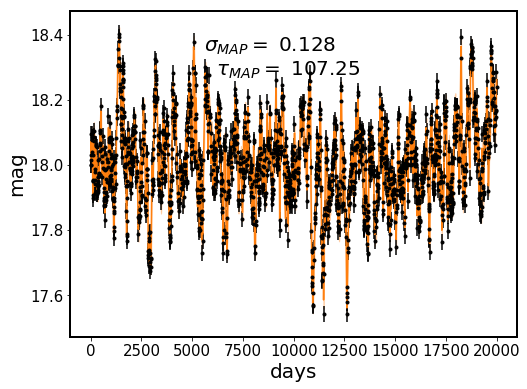

In [251]:
# set the input parameters  for simulated light curve 
# as in Kozlowski Chap.3
tau_in = 100
SF_inf = 0.2
sigma_in = SF_inf / np.sqrt(2)
Npoints  = 2000
baseline = 20000
# I simulate with very good sampling : 
# 4 per day 
t = np.sort(np.random.uniform(0,baseline, Npoints)) 
y = mod.sim_DRW_lightcurve(t, SF_inf, tau_in , 18)
yerr = 0.0248 
lc = {'t':t, 'y':y, 'yerr':yerr}
np.save('test_ls_tau-200_SFinf-0.2_N-2000', lc)

# First : see how subsampling affects the MAP prediction ....
sig_lims , tau_lims = [0.02,0.7], [1,10000]
Ngrid=100
sigma_fit, tau_fit,gp = find_celerite_MAP(t,y,
                        yerr, sigma_in, tau_in,prior='Jeff1',
                  set_bounds = True , sig_lims = sig_lims  , 
                  tau_lims =tau_lims, verbose = True )
plot_gp_prediction(t, y, yerr, gp, sigma_fit, tau_fit)

scale , Ngrid = 'log', 100
sigma_grid , tau_grid = make_grid(scale, sig_lims, tau_lims, Ngrid)

logP = evaluate_logP(sigma_grid, tau_grid,y,gp, prior='Jeff1')



sigma_exp= 0.130329730552
tau_exp= 111.248383599


array([[-10., -10., -10., ..., -10., -10., -10.],
       [-10., -10., -10., ..., -10., -10., -10.],
       [-10., -10., -10., ..., -10., -10., -10.],
       ..., 
       [-10., -10., -10., ..., -10., -10., -10.],
       [-10., -10., -10., ..., -10., -10., -10.],
       [-10., -10., -10., ..., -10., -10., -10.]])

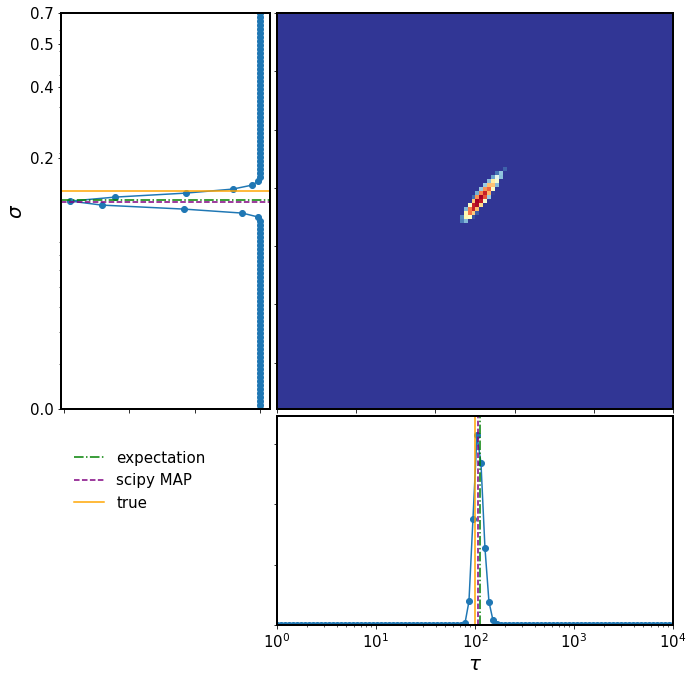

In [252]:
# plot the logP
plot_logP(logP, sigma_grid, tau_grid, sigma_fit, tau_fit, sigma_in, tau_in, 
         scale, verbose=True)

In [15]:
### Do that 1000 times : 

# set the input parameters  for simulated light curve 
# as in Kozlowski Chap.3
tau_in = 100
SF_inf = 0.2
sigma_in = SF_inf / np.sqrt(2)
Npoints  = 2000
baseline = 20000

# Fitting params for Celerite 
sig_lims , tau_lims = [0.02,0.7], [1,1000]
#Ngrid=100
    
sigmaMAP = []
tauMAP   =  []

sigmaEXP = []
tauEXP = [] 
for i in range(1000):
    print(i)
    t = np.sort(np.random.uniform(0,baseline, Npoints)) 
    y = mod.sim_DRW_lightcurve(t, SF_inf, tau_in , 18)
    yerr = 0.0248 
    lc = {'t':t, 'y':y, 'yerr':yerr}
    np.save('test_ls_tau-200_SFinf-0.2_N-2000_'+str(i), lc)

    sigma_fit, tau_fit,gp = find_celerite_MAP(t,y, yerr, sigma_in, tau_in,
                      prior='Jeff1', set_bounds = True , sig_lims = sig_lims, 
                      tau_lims =tau_lims, verbose = False )
    sigmaMAP.append(sigma_fit)
    tauMAP.append(tau_fit)
    
    scale , Ngrid = 'log', 100
    sigma_grid , tau_grid = make_grid(scale, sig_lims, tau_lims, Ngrid)
    logP = evaluate_logP(sigma_grid, tau_grid,y,gp, prior='Jeff1')
    


0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

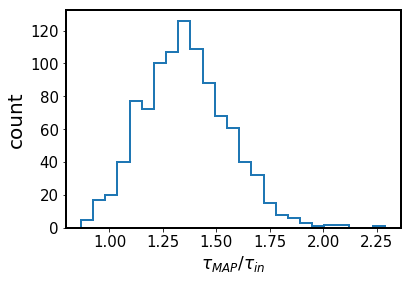

In [16]:
plt.hist(np.array(taus)/200, histtype='step', lw=2, bins=25)
plt.xlabel(r'$\tau_{MAP} / \tau_{in}$', fontsize=17)
plt.ylabel('count')
plt.savefig('Kozlowski_ideal_case_MAP_tau.png', bbox_inches='tight')

So the peak of logP is not aligned with truth even in perfect case ?? ?

I wonder if in the experiment of subsampling the 'ideal' light curve at SDSS or OGLE cadence Kozlowski is not employing a logarithmic scale for log(P) - having a logarithmic grid of tau between 1 and 10 000, so that it's perhaps easier to find a narrow peak ... Then to actually fin the expectation value I would have to convert the samplings in log space to samplings in linear space anyway, but perhaps it would be easier?   I'm not sure what's the solution ... '

Next steps  : 
   
   * take those light curves that I already prepared earlier (in N0_Kozlowski_Fig2_calculate), and run them through the mill above - is this sufficient to work ?  Does it crash at any value of rho ?  are there cases where tau peak is completely unresolved ? 
   * if the result of the above is positive, try running it on all of them, and try to reproduce Fig.2 

Poster : 
    * I submitted work based on adding points to existing light curves - shall I rather modify that to show the adaptative grid method ? 
    * Need to send one slide by this Monday ... 

Simulation 5a : take the SDSS S82 LCs ..

In [178]:
# first, simulate the light curves 
SF_inf = 0.2 # mag 
t_exp = 8 * 365.0 # in days  # the length of the light curve 


plot = False

ogle_lc = {}

t445 = np.sort(np.random.randint(low=0, high=t_exp, size=445))
ogle_lc['t'] = t445

t60 = np.loadtxt('t_SDSS.txt')
sdss_lc['t'] = t60


# iterate over rho grid , which is the grid of 
# input values of tau 
rho_min, rho_max,  n_rho = 0.001, 10, 100
rho_grid = np.logspace(np.log10(rho_min), np.log10(rho_max), n_rho)
for i,rho_in in enumerate(rho_grid) : 
    tau_in = rho_in * t_exp
    ogle_lc[i] = {'rho':rho_in, 
                  'y': mod.sim_DRW_lightcurve(t445, SF_inf, tau_in , 18)}
    sdss_lc[i] = {'rho':rho_in,
                  'y': mod.sim_DRW_lightcurve(t60, SF_inf, tau_in , 18)}

In [179]:
min(rho_grid*t_exp)

2.9199999999999999

In [181]:
max(rho_grid*t_exp)

29200.0

30
tau_in =  47.5887243709
[-3.21887582 -5.29831737]
sig_lims: [0.02, 0.7] tau_lims: [1, 30000]
[(-7.8240460108562919, -0.71334988787746489), (-10.308952660644293, 0.0)]
sigma_fit 0.2 tau_fit 200.0


/Users/chris/anaconda3/envs/py36/lib/python3.6/site-packages/scipy/optimize/optimize.py:628: RuntimeWarning: invalid value encountered in double_scalars
  grad[k] = (f(*((xk + d,) + args)) - f0) / d[k]


Need to provide figname! 


array([[-10., -10., -10., ..., -10., -10., -10.],
       [-10., -10., -10., ..., -10., -10., -10.],
       [-10., -10., -10., ..., -10., -10., -10.],
       ..., 
       [-10., -10., -10., ..., -10., -10., -10.],
       [-10., -10., -10., ..., -10., -10., -10.],
       [-10., -10., -10., ..., -10., -10., -10.]])

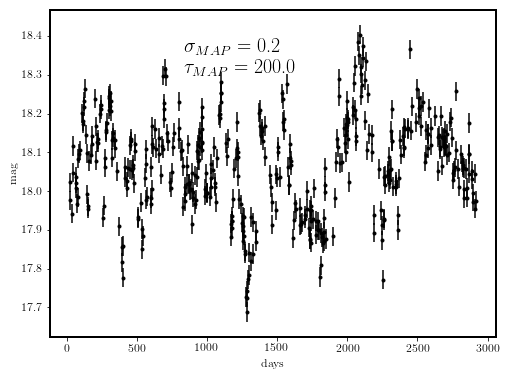

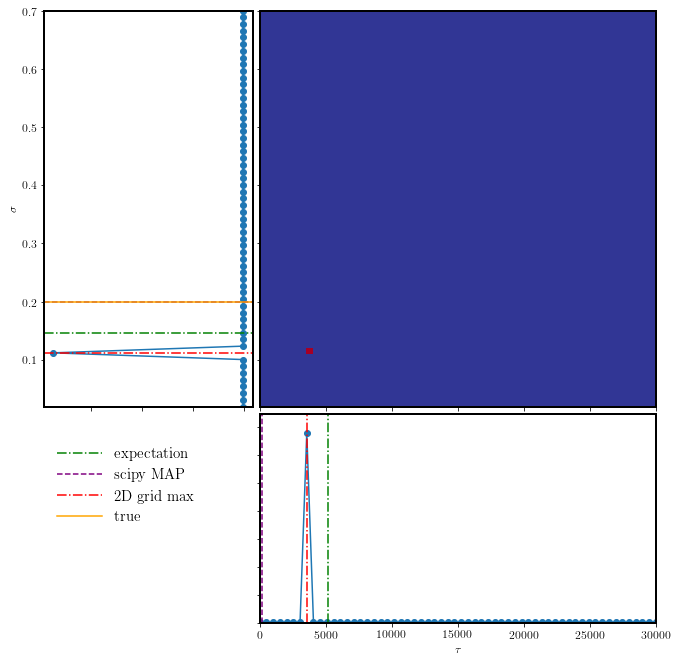

In [182]:
# Gaussian noise added to each light curve
loc=0; var = 0.0248445133097
noise  = np.random.normal(loc=loc,scale=np.sqrt(var),size=445)

# Variance for OGLE - using eq. from Kozlowski+2017
I = 18 # mag  - mean magnitude of the assumed light curve 
variance = 0.004**2.0 + np.exp(1.63 * (I - 22.55)) 

sig_lims , tau_lims = [0.02,0.7], [1,30000]

# All input params to # initialize Celerite DRW kernel 
#for i in range(50,51):# len(ogle_lc.keys())): 
i =30
print(i)
rho_in = ogle_lc[i]['rho']
tau_in = rho_in * t_exp
print('tau_in = ', tau_in)
yDRW = ogle_lc[i]['y']
noise = np.random.normal(loc=0,scale=np.sqrt(variance),size=len(yDRW))
t = ogle_lc['t']
y = yDRW + noise 
yerr = np.ones_like(t)* np.sqrt(variance)

sigma_fit, tau_fit,gp = find_celerite_MAP(t,y, yerr, sigma_in,200,
                                          prior='Jeff2',
                  set_bounds = True , sig_lims = sig_lims  , 
                  tau_lims =tau_lims, 
                  plot_prediction=True, savefig = False, 
                  verbose = True )

sigma_grid = np.linspace(sig_lims[0], sig_lims[1],Ngrid )
tau_grid  = np.linspace(tau_lims[0], tau_lims[1], Ngrid) 
logP = evaluate_logP(sigma_grid, tau_grid,y,gp, prior='Jeff2')

# plot the logP
plot_logP(logP, sigma_grid, tau_grid, sigma_fit, tau_fit,  sigma_in, tau_in,
         savefig=False)

(array([ 76.,   7.,   4.,   3.,   2.,   2.,   2.,   1.,   1.,   2.]),
 array([  2.92000000e+00,   4.38262800e+03,   8.76233600e+03,
          1.31420440e+04,   1.75217520e+04,   2.19014600e+04,
          2.62811680e+04,   3.06608760e+04,   3.50405840e+04,
          3.94202920e+04,   4.38000000e+04]),
 <a list of 10 Patch objects>)

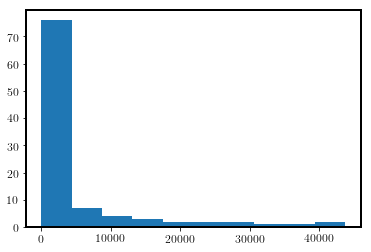

In [171]:
plt.hist(rho_grid*t_exp)

In [175]:
min(rho_grid*t_exp)

2.9199999999999999

In [183]:
max(rho_grid*t_exp)

29200.0

0
tau_in =  2.92
1
tau_in =  3.20469639524
2
tau_in =  3.51715033756
3
tau_in =  3.86006815352
4
tau_in =  4.23642003321
5
tau_in =  4.64946575656
6
tau_in =  5.10278292802
7
tau_in =  5.60029796408
8
tau_in =  6.14632010198
9
tau_in =  6.74557872424
10
tau_in =  7.40326432239


/Users/chris/anaconda3/envs/py36/lib/python3.6/site-packages/matplotlib/pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


11
tau_in =  8.12507345444
12
tau_in =  8.91725808579
13
tau_in =  9.78667974074
14
tau_in =  10.7408689337
15
tau_in =  11.7880903951
16
tau_in =  12.9374146561
17
tau_in =  14.1987966138
18
tau_in =  15.5831617551
19
tau_in =  17.1025007887
20
tau_in =  18.7699735025
21
tau_in =  20.6000227473
22
tau_in =  22.6084995343
23
tau_in =  24.8128003285
24
tau_in =  27.232017729
25
tau_in =  29.8871058395
26
tau_in =  32.801061763
27
tau_in =  35.9991247917
28
tau_in =  39.5089950177
29
tau_in =  43.3610732578
30
tau_in =  47.5887243709
31
tau_in =  52.2285662485
32
tau_in =  57.3207869812
33
tau_in =  62.9094929489
34
tau_in =  69.0430908492
35
tau_in =  75.7747069729
36
tau_in =  83.1626473583
37
tau_in =  91.2709028109
38
tau_in =  100.16970316
39
tau_in =  109.936125558
40
tau_in =  120.654762083
41
tau_in =  132.418452437
42
tau_in =  145.329088078
43
tau_in =  159.498494756
44
tau_in =  175.049401093
45
tau_in =  192.1165016
46
tau_in =  210.847623337
47
tau_in =  231.405006319
48
tau

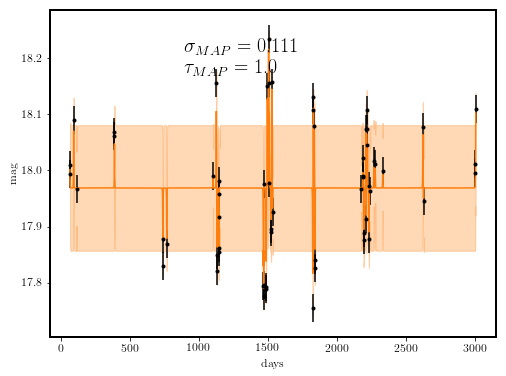

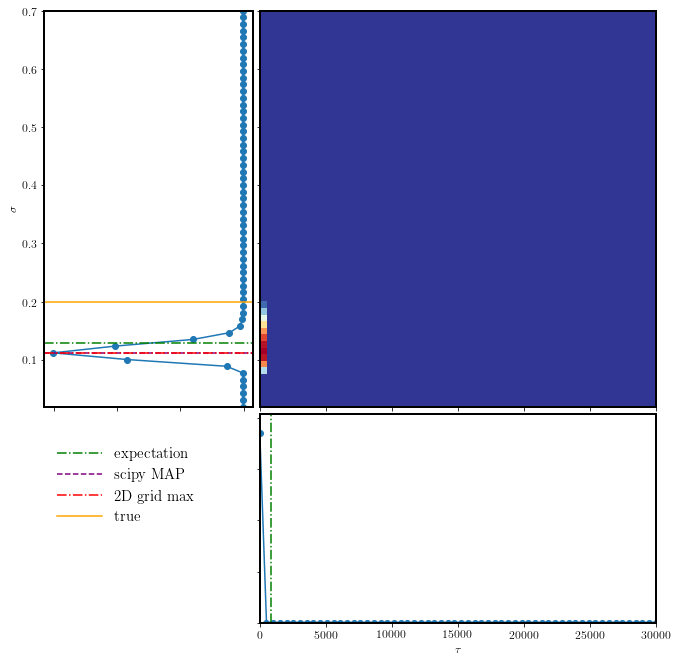

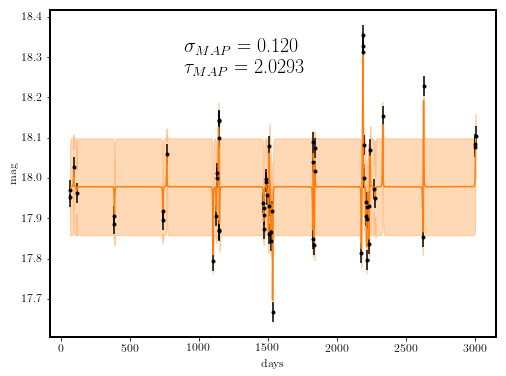

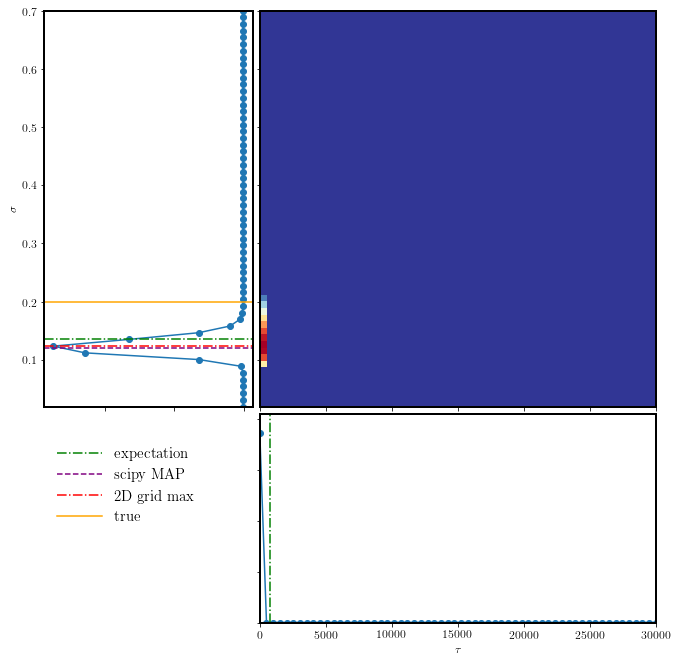

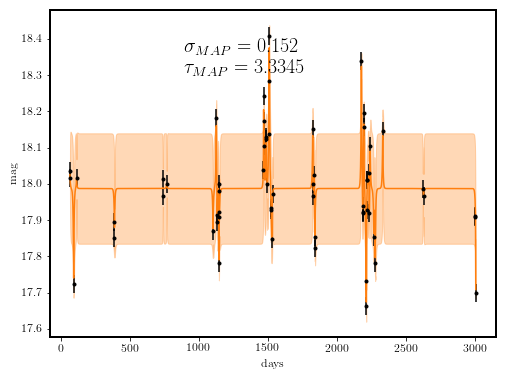

...

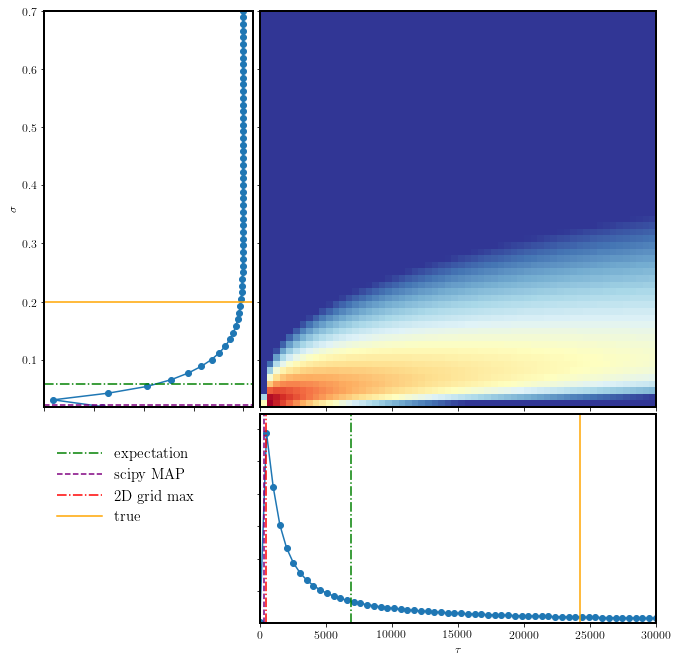

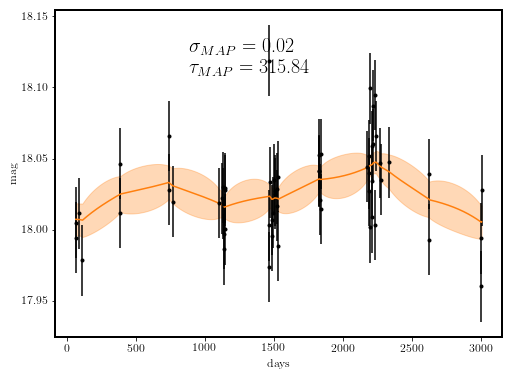

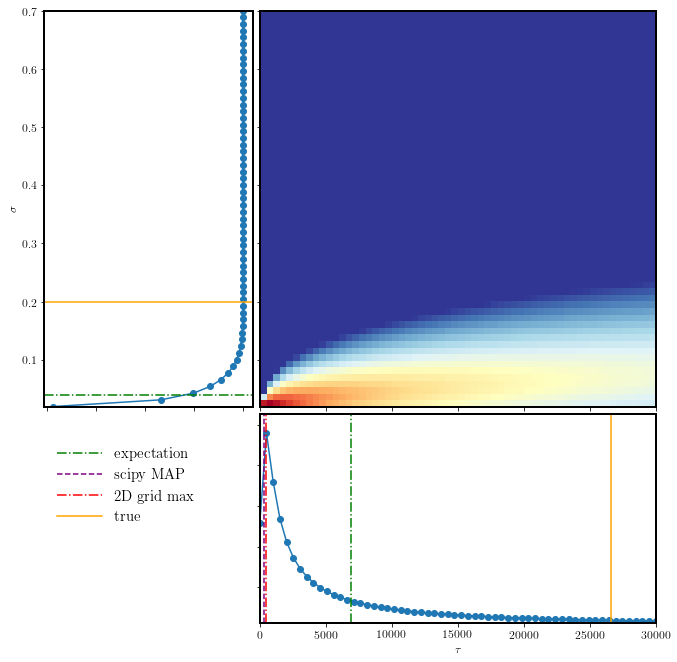

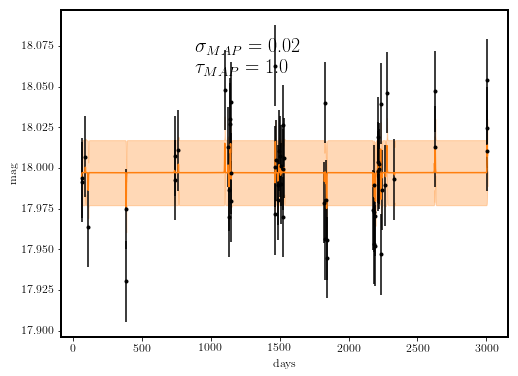

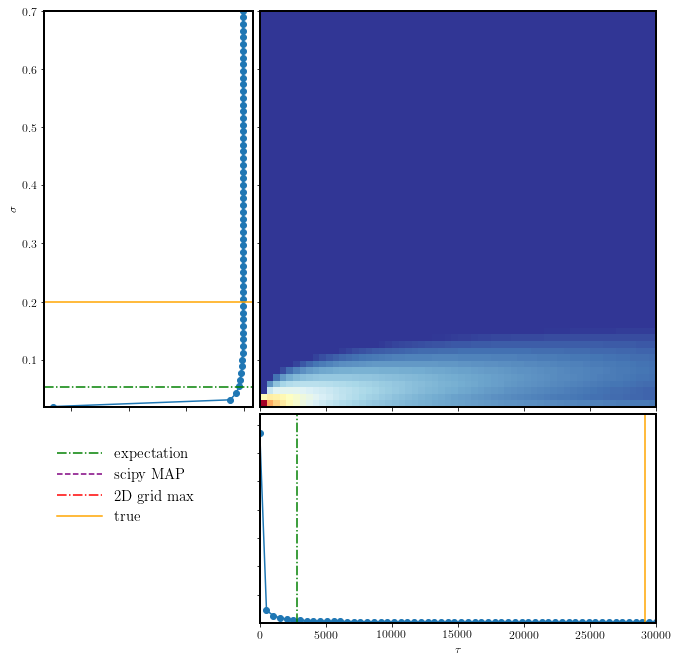

In [184]:
# the limits should not exclude the minimum and maximum input value ! 
sig_lims , tau_lims = [0.02,0.7], [1,30000]

for i in range(len(rho_grid)):
    print(i)
    rho_in = sdss_lc[i]['rho']
    yDRW = sdss_lc[i]['y']
    t = sdss_lc['t']

    tau_in = rho_in * t_exp
    print('tau_in = ', tau_in)

    noise = np.random.normal(loc=0,scale=np.sqrt(variance),size=len(yDRW))

    y = yDRW + noise 
    yerr = np.ones_like(t)* np.sqrt(variance)

    figname = 'S82_fits/'+str(i).zfill(3)+'_tau-'+str(tau_in)[:5]+'_lc_fit.png'

    sigma_fit, tau_fit,gp = find_celerite_MAP(t,y, yerr, sigma_in,tau_in,
                                              prior='Jeff2',
                      set_bounds = True , sig_lims = sig_lims  , 
                      tau_lims =tau_lims, 
                      plot_prediction=True, savefig = True, figname = figname,
                      verbose = False )

    sigma_grid = np.linspace(sig_lims[0], sig_lims[1],Ngrid )
    tau_grid  = np.linspace(tau_lims[0], tau_lims[1], Ngrid) 
    logP = evaluate_logP(sigma_grid, tau_grid,y,gp, prior='Jeff2')

    # plot the logP
    figname = 'S82_fits/'+str(i).zfill(3)+'_tau-'+str(tau_in)[:5]+'_logP_space.png'
    plot_logP(logP, sigma_grid, tau_grid, sigma_fit, tau_fit,  sigma_in, tau_in,
             savefig=True, figname = figname)

In [159]:
str(i).zfill(3)

'050'

### Simulation 6 

Test the effect of increasing the grid density - finding the new limits. 

p(x)> 0.05  for the following grid indices 
[ 7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23]
Old grid: [ 0.10067797  0.11220339  0.12372881  0.13525424  0.14677966  0.15830508
  0.16983051  0.18135593  0.19288136  0.20440678  0.2159322   0.22745763
  0.23898305  0.25050847  0.2620339   0.27355932]
New grid: [ 0.10067797  0.10342211  0.10616626  0.10891041  0.11165456  0.11439871
  0.11714286  0.11988701  0.12263115  0.1253753   0.12811945  0.1308636
  0.13360775  0.1363519   0.13909605  0.14184019  0.14458434  0.14732849
  0.15007264  0.15281679  0.15556094  0.15830508  0.16104923  0.16379338
  0.16653753  0.16928168  0.17202583  0.17476998  0.17751412  0.18025827
  0.18300242  0.18574657  0.18849072  0.19123487  0.19397902  0.19672316
  0.19946731  0.20221146  0.20495561  0.20769976  0.21044391  0.21318805
  0.2159322   0.21867635  0.2214205   0.22416465  0.2269088   0.22965295
  0.23239709  0.23514124  0.23788539  0.24062954  0.24337369  0.24611784
  0.24886199  0.25160613  0.254

p(x)> 0.05  for the following grid indices 
[ 6  7  8  9 10 11 12 13 14 15 16 17]
Old grid: [ 0.08915254  0.10067797  0.11220339  0.12372881  0.13525424  0.14677966
  0.15830508  0.16983051  0.18135593  0.19288136  0.20440678]
New grid: [ 0.08915254  0.09183287  0.0945132   0.09719354  0.09987387  0.1025542
  0.10523453  0.10791486  0.11059519  0.11327552  0.11595585  0.11863618
  0.12131652  0.12399685  0.12667718  0.12935751  0.13203784  0.13471817
  0.1373985   0.14007883  0.14275916  0.1454395   0.14811983  0.15080016
  0.15348049  0.15616082  0.15884115  0.16152148  0.16420181  0.16688214
  0.16956248  0.17224281  0.17492314  0.17760347  0.1802838   0.18296413
  0.18564446  0.18832479  0.19100512  0.19368546  0.19636579  0.19904612
  0.20172645  0.20440678]
p(x)> 0.05  for the following grid indices 
[2 3 4 5 6 7 8 9]
Old grid: [  34.86440678   51.79661017   68.72881356   85.66101695  102.59322034
  119.52542373  136.45762712]
New grid: [  34.86440678   38.62711864   42.38983051  

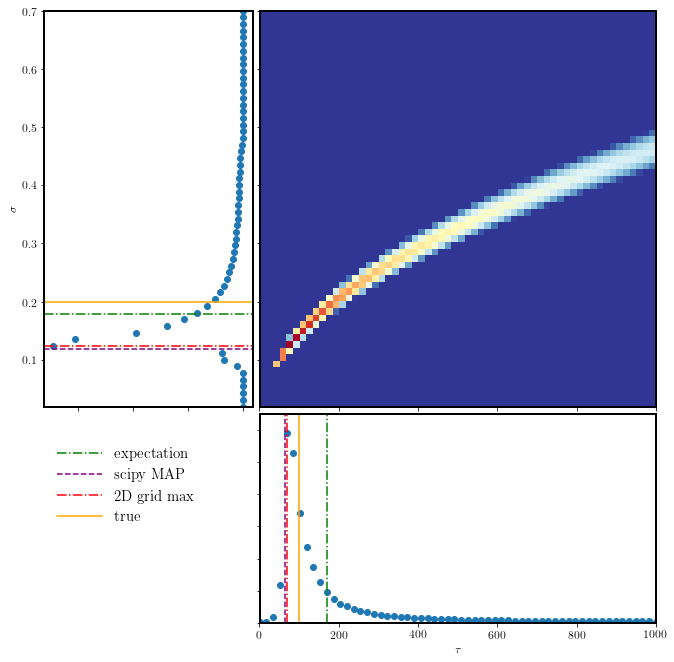

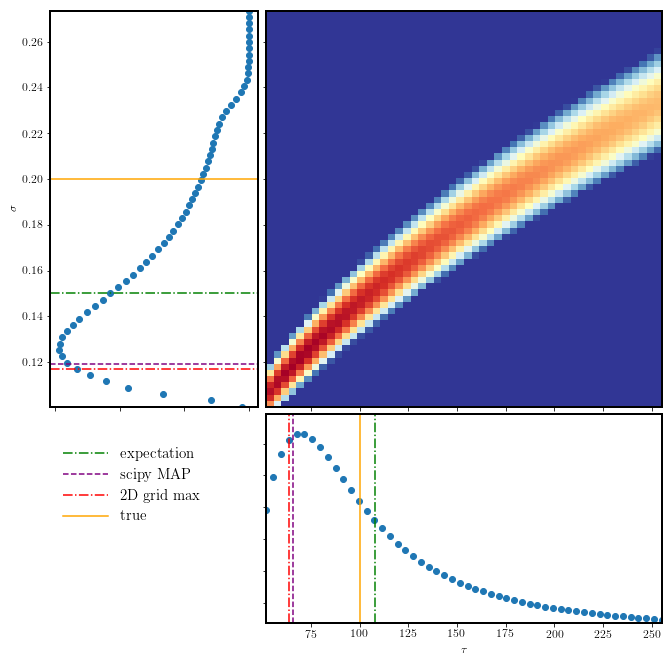

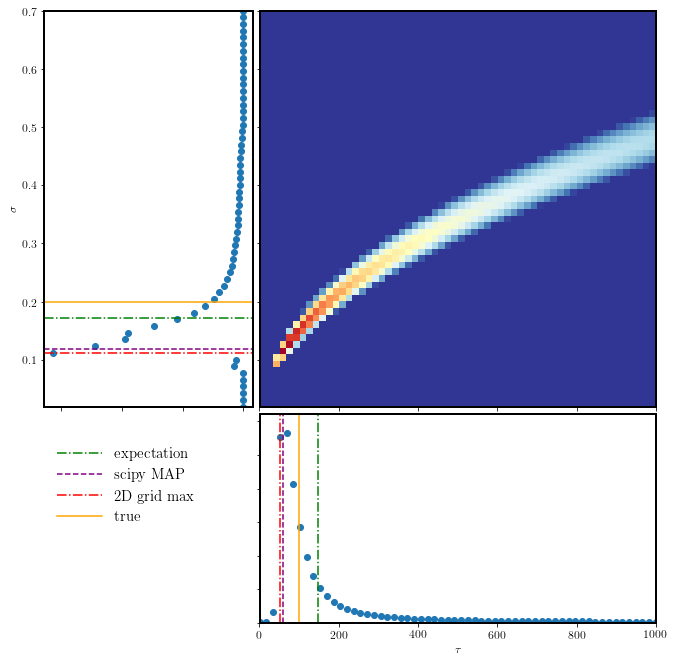

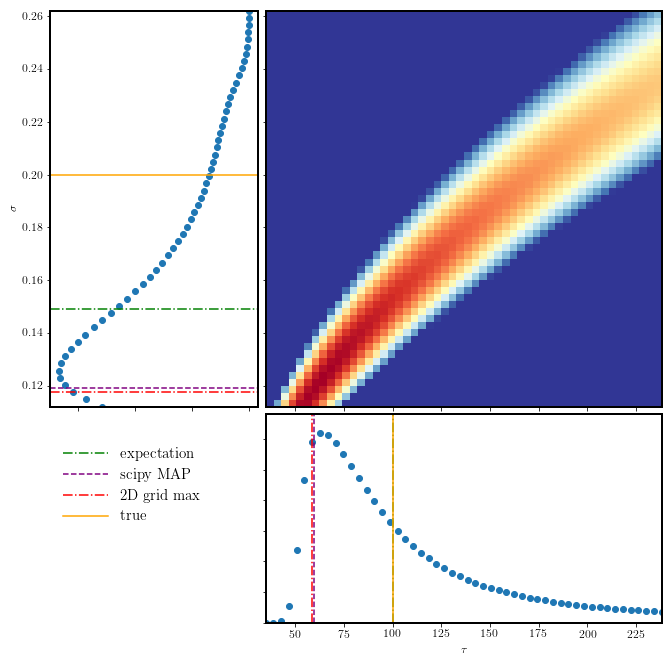

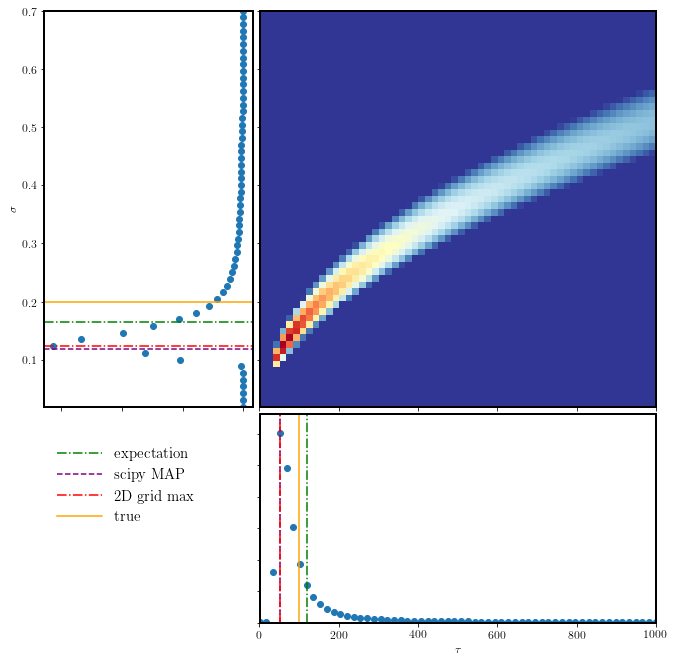

...

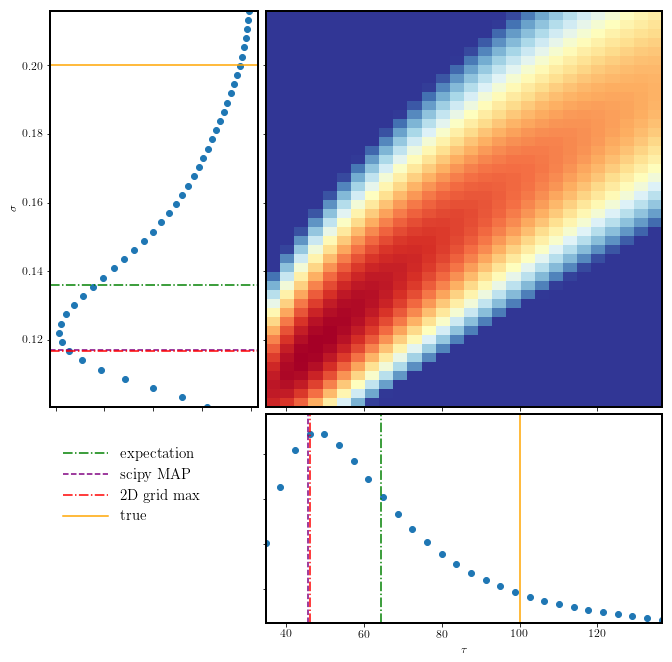

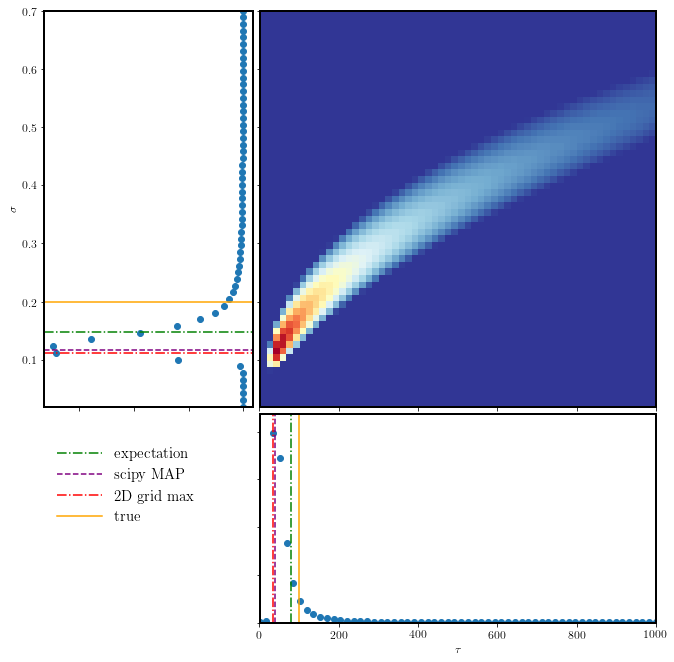

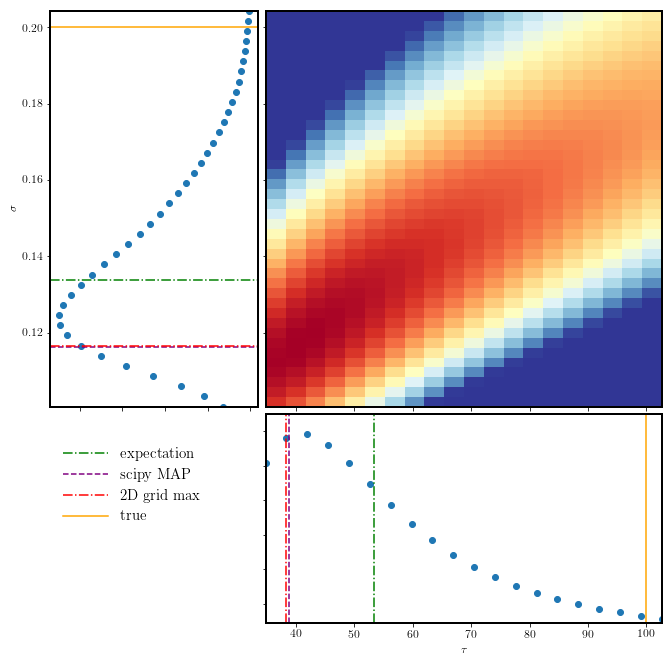

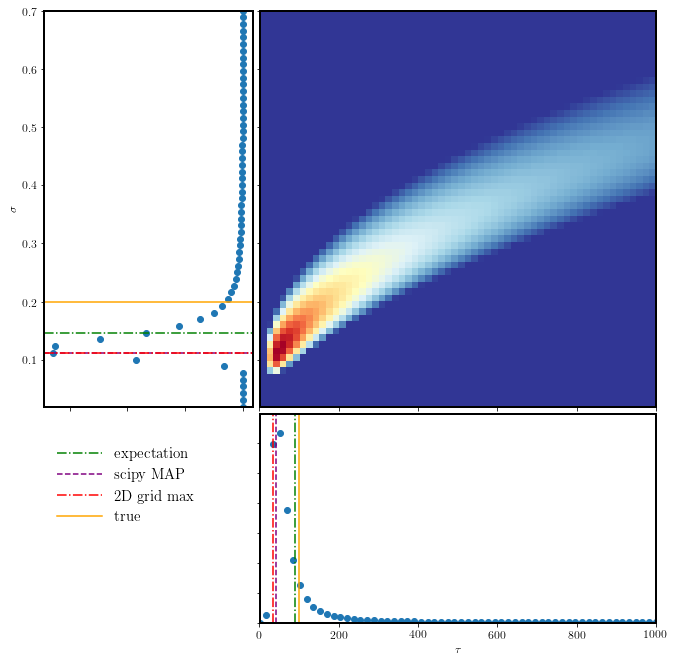

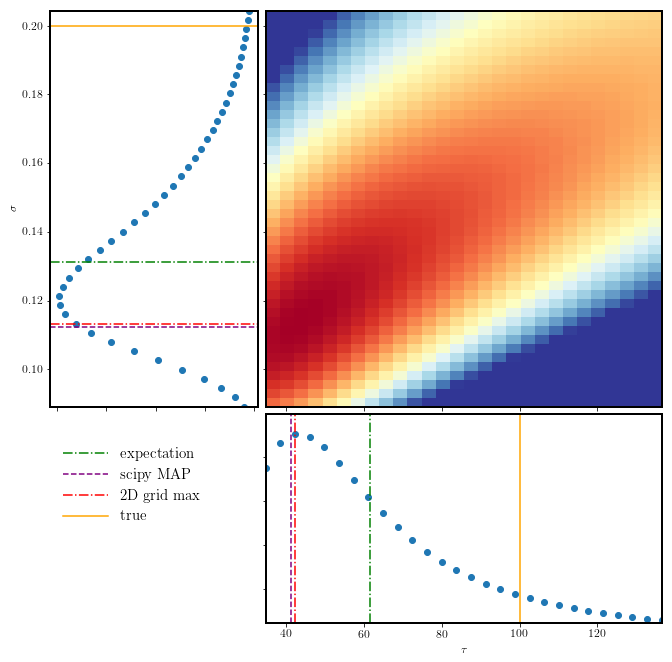

In [186]:
sig_lims , tau_lims = [0.02,0.7], [1,1000]
# Second, plot the logP for each subsampling, see if it makes things better / worse ... 
for sub in [1,4,10,20,40,80]:
    # evaluate logP on a grid 
    Ngrid = 60 
    sigma_grid = np.linspace(sig_lims[0], sig_lims[1],Ngrid )
    tau_grid  = np.linspace(tau_lims[0], tau_lims[1], Ngrid)
    
    t_sub, y_sub = t[::sub],y[::sub]
    sigma_fit, tau_fit,gp = find_celerite_MAP(t_sub, y_sub,
                            yerr, sigma_in, tau_in,prior='Jeff2',
                      set_bounds = True , sig_lims = sig_lims  , 
                      tau_lims =tau_lims, 
                      plot_prediction=False, verbose = False )
    
    logP = evaluate_logP(sigma_grid, tau_grid,y_sub,gp, prior='Jeff2')

    # plot the logP
    plot_logP(logP, sigma_grid, tau_grid, sigma_fit, tau_fit,  sigma_in, tau_in)


    # increase the grid density 
    sigma_grid2 = increase_grid_density(logP, sigma_grid,  param='sigma', threshold=0.05,
                                        by_hand=False,
                                       density=4)
    tau_grid2 =  increase_grid_density(logP, tau_grid, param='tau', threshold=0.05,
                                       by_hand=False,
                                      density=4)

    # evaluate logP on a new grid 
    logP2 = evaluate_logP(sigma_grid2, tau_grid2,y_sub,gp,prior='Jeff2')

    # plot the new logP 
    plot_logP(logP2, sigma_grid2, tau_grid2, sigma_fit, tau_fit, sigma_in, tau_in)



In [187]:
increase_grid_density??

p(x)> 0.05  for the following grid indices 
[10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34
 35 36 37 38 39 40 41 42 43 44 45 46]
Old grid: [ 0.13525424  0.14677966  0.15830508  0.16983051  0.18135593  0.19288136
  0.20440678  0.2159322   0.22745763  0.23898305  0.25050847  0.2620339
  0.27355932  0.28508475  0.29661017  0.30813559  0.31966102  0.33118644
  0.34271186  0.35423729  0.36576271  0.37728814  0.38881356  0.40033898
  0.41186441  0.42338983  0.43491525  0.44644068  0.4579661   0.46949153
  0.48101695  0.49254237  0.5040678   0.51559322  0.52711864  0.53864407]
New grid: [ 0.13525424  0.13807515  0.14089605  0.14371696  0.14653787  0.14935878
  0.15217968  0.15500059  0.1578215   0.16064241  0.16346332  0.16628422
  0.16910513  0.17192604  0.17474695  0.17756786  0.18038876  0.18320967
  0.18603058  0.18885149  0.1916724   0.1944933   0.19731421  0.20013512
  0.20295603  0.20577693  0.20859784  0.21141875  0.21423966  0.21706057
  0.21988147  0.222

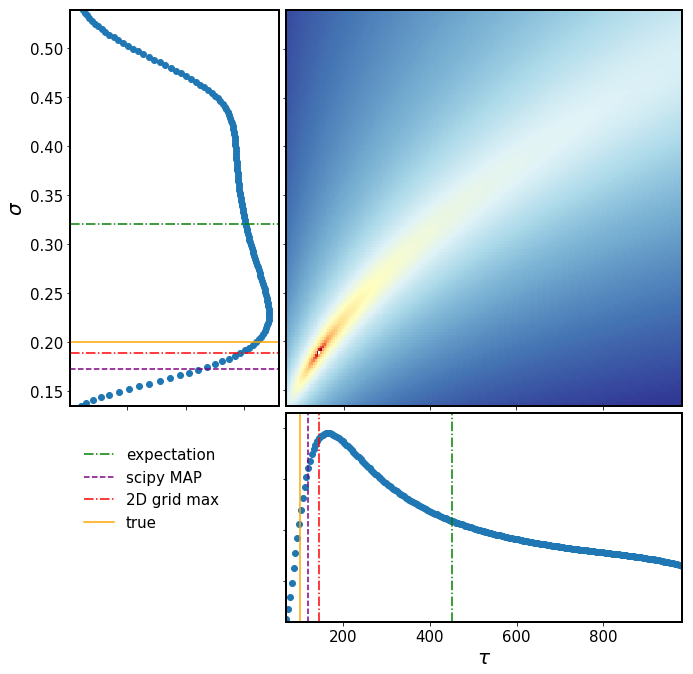

Consider the light curve that has SDSS S82 sampling - can we recover the period at all ? 